In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))
        
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Importing necessary library

In [2]:
#We import some library in this cell and then we are going to use the differents folder to buils the dataset
# A training and testing dataset
from PIL import Image
from numpy import array
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from warnings import filterwarnings
import warnings
import random


#import pydot
from tensorflow.keras.utils import plot_model

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras import optimizers
from tensorflow.keras.layers import Conv2D,MaxPooling2D,BatchNormalization,GlobalAveragePooling2D,GlobalMaxPooling2D,Lambda,ZeroPadding2D
tf.keras.backend.clear_session()
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, MaxPool2D, Flatten, Dropout
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard

#from keras.utils import np_utils
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

import cv2
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
import os
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import EfficientNetB0
import io
import ipywidgets as widgets
from IPython.display import display, clear_output

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error as mse

import copy

from tensorflow.keras import models
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2DTranspose,\
                                    GlobalAveragePooling2D, AveragePooling2D, MaxPool2D, UpSampling2D,\
                                    BatchNormalization, Activation, Input,\
                                    Add, Multiply, Concatenate, concatenate, Softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.activations import softmax

tf.keras.backend.set_image_data_format('channels_last')


%matplotlib inline
warnings.simplefilter('ignore')

2025-05-23 15:14:51.545350: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-23 15:14:51.545485: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-23 15:14:51.674044: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose,\
                                    GlobalAveragePooling2D, AveragePooling2D, MaxPool2D, UpSampling2D,\
                                    BatchNormalization, Activation, ReLU, Flatten, Dense, Input,\
                                    Add, Multiply, Concatenate, Softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.activations import softmax

tf.keras.backend.set_image_data_format('channels_last')
import keras.backend as K

In [4]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, Add
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam

# Pre-processing

In [5]:
labels=['pituitary_tumor','meningioma_tumor']
labels_2 = ['aneurysm','cancer','tumor']

In [6]:
X_train = []
y_train = []
image_size = 128
for i in labels:
    folderPath = os.path.join('/kaggle/input/brain-tumor-classification-mri/','Training',i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size,image_size))
        img = cv2. cvtColor(img, cv2.COLOR_BGR2GRAY)
        #img = np.array(img)
        X_train.append(img)
#folderPath_2 = os.path.join('/kaggle/input/ct-to-mri-cgan/Dataset/images/','trainA')
#for j in tqdm(os.listdir(folderPath_2)):
#    img = cv2.imread(os.path.join(folderPath_2,j))
#    img = cv2.resize(img,(image_size,image_size))
#    img = cv2. cvtColor(img, cv2.COLOR_BGR2GRAY)
    #img = np.array(img)
#    X_train.append(img) 
X_train = np.array(X_train)

100%|██████████| 822/822 [00:10<00:00, 82.01it/s]


In [7]:
X_train20 = copy.deepcopy(X_train)

In [8]:
X_train1 = copy.deepcopy(X_train20)

In [9]:
X_train20.shape

(1649, 128, 128)

In [10]:
X_Train = X_train1[:989]

X_Train_2 = X_train1[:989]

x_Test = X_train1[989:1319]

X_val = X_train1[1319:]

(-0.5, 127.5, 127.5, -0.5)

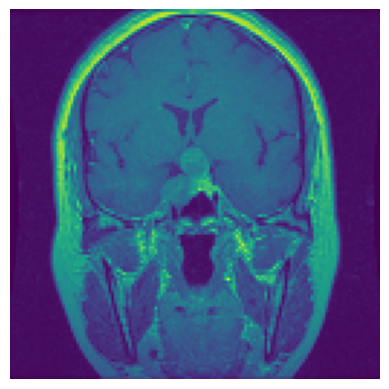

In [11]:
plt.imshow(X_Train[506])
plt.axis('off')

# Noising the images

In [12]:
def add_noise_and_clip(data, noise=0.05, distribution='laplace', **kwargs):
    # Convert data to float to avoid type errors
    data = data.astype(np.float32)

    # Initialize noise distribution based on the specified type
    if distribution == 'tstudent':
        df = kwargs.get('df', 1)  # Degrees of freedom
        noise_dist = np.random.standard_t(df, size=(data.shape[0], 128, 128))
    elif distribution == 'poisson':
        lam = kwargs.get('lam', 1)  # Rate parameter
        noise_dist = np.random.poisson(lam, size=(data.shape[0], 128, 128))
    elif distribution == 'binomial':
        n = kwargs.get('n', 1)  # Number of trials
        p = kwargs.get('p', 0.5)  # Probability of success
        noise_dist = np.random.binomial(n, p, size=(data.shape[0], 128, 128))
    elif distribution == 'beta':
        a = kwargs.get('a', 1)  # Alpha parameter
        b = kwargs.get('b', 1)  # Beta parameter
        noise_dist = np.random.beta(a, b, size=(data.shape[0], 128, 128))
    else:
        # Default to Laplace distribution
        scale = kwargs.get('scale', 50)  # Scale parameter
        noise_dist = np.random.laplace(loc=0, scale=scale, size=(data.shape[0], 128, 128))

    # Add noise to the data
    data += noise * noise_dist
    # Clip the values and normalize
    return np.clip(data / 255, 0., 1.)

# Concatenate several noise-added datasets wrapped in a list
X_Train = np.concatenate([
    #add_noise_and_clip(X_Train[:int(X_Train.shape[0]*0.1)], noise=0.09, distribution='tstudent', df=2),
    #add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.1):int(X_Train.shape[0]*0.2)], noise=0.09, distribution='poisson', lam=5),
    add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.2):int(X_Train.shape[0]*0.3)], noise=0.09, distribution='binomial', n=10, p=0.5),
    add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.3):int(X_Train.shape[0]*0.4)], noise=0.09, distribution='laplace', scale=50),
    #add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.4):], noise=0.09, distribution='beta', a=2, b=2)
])

In [13]:
# Concatenate several noise-added datasets wrapped in a list
x_Test = np.concatenate([
    add_noise_and_clip(x_Test[:int(x_Test.shape[0]*0.2)], noise=0.001, distribution='tstudent', df=0.2),
    add_noise_and_clip(x_Test[int(x_Test.shape[0]*0.2):int(x_Test.shape[0]*0.4)], noise=0.5, distribution='poisson', lam=150),
    add_noise_and_clip(x_Test[int(x_Test.shape[0]*0.4):int(x_Test.shape[0]*0.6)], noise=50.05, distribution='binomial', n=10, p=0.02),
    add_noise_and_clip(x_Test[int(x_Test.shape[0]*0.6):int(x_Test.shape[0]*0.8)], noise=0.05, distribution='laplace', loc=0, scale=250),
    add_noise_and_clip(x_Test[int(x_Test.shape[0]*0.8):], noise=50.05, distribution='beta', a=2, b=2)
])

In [14]:
# Concatenate several noise-added datasets wrapped in a list
X_val = np.concatenate([
    add_noise_and_clip(X_val[:int(X_val.shape[0]*0.2)], noise=0.001, distribution='tstudent', df=0.2),
    add_noise_and_clip(X_val[int(X_val.shape[0]*0.2):int(X_val.shape[0]*0.4)], noise=0.5, distribution='poisson', lam=150.0),
    add_noise_and_clip(X_val[int(X_val.shape[0]*0.4):int(X_val.shape[0]*0.6)], noise=50.05, distribution='binomial', n=10, p=0.02),
    add_noise_and_clip(X_val[int(X_val.shape[0]*0.6):int(X_val.shape[0]*0.8)], noise=0.05, distribution='laplace',loc=0, scale=250),
    add_noise_and_clip(X_val[int(X_val.shape[0]*0.8):], noise=50, distribution='beta', a=2, b=2)
])

In [15]:
# Concatenate several noise-added datasets wrapped in a list
X_Train_2 = np.concatenate([
    add_noise_and_clip(X_Train[:int(X_Train.shape[0]*0.2)], noise=0.001, distribution='tstudent', df=0.2),
    add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.2):int(X_Train.shape[0]*0.4)], noise=0.5, distribution='poisson', lam=150.0),
    add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.4):int(X_Train.shape[0]*0.6)], noise=50.05, distribution='binomial', n=10, p=0.02),
    add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.6):int(X_Train.shape[0]*0.8)], noise=0.05, distribution='laplace', loc=0,scale=250),
    add_noise_and_clip(X_Train[int(X_Train.shape[0]*0.8):], noise=50, distribution='beta', a=2, b=2)
])

noise = 0.05
for i in range(X_Train.shape[0]):
    dist = np.random.laplace(loc=0, scale=50, size=(128, 128))  # Replace with desired non-iid distribution
    X_val[i] = X_Train[i] + noise * dist
X_Train = np.clip(X_Train / 255, 0., 1.)

for i in range(x_Test.shape[0]):
    dist = np.random.laplace(loc=0, scale=50, size=(128, 128))  # Replace with desired non-iid distribution
    x_Test[i] = x_Test[i] + noise * dist
x_Test = np.clip(x_Test / 255, 0., 1.)

for i in range(X_val.shape[0]):
    dist = np.random.laplace(loc=0, scale=50, size=(128, 128))  # Replace with desired non-iid distribution
    X_val[i] = X_val[i] + noise * dist
X_val = np.clip(X_val / 255, 0., 1.)

In [16]:
X_Train_1 = copy.deepcopy(X_Train_2)

# Shuffle the array elements
random.shuffle(X_val)
random.shuffle(X_Train_1)

In [17]:
X_Train.shape, x_Test.shape, X_val.shape

((989, 128, 128), (330, 128, 128), (330, 128, 128))

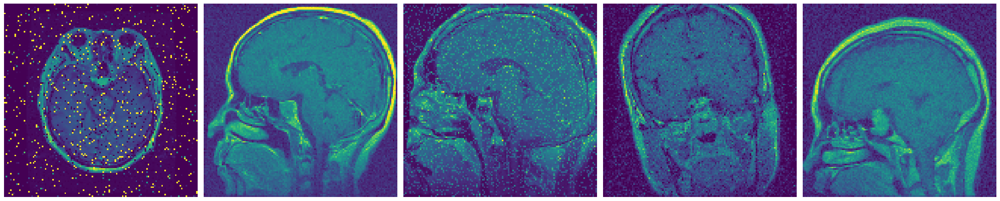

In [18]:
# Example: Create random images as NumPy arrays
# Replace these with your actual image arrays
image1 = X_Train_1[5]
image2 = X_Train_1[205]
image3 = X_Train_1[405]
image4 = X_Train_1[605]
image5 = X_Train_1[805]
#image6 = X_train[5]
#image7 = X_train[205]
#image8 = X_train[405]
#image9 = X_train[605]
#image10 = X_train[805]
#image11 = X_val[280]
#image12 = X_val[281]
#image13 = x_Test[5]
#image14 = x_Test[70]
#image15 = x_Test[140]
#image16 = x_Test[210]
#image17 = x_Test[280]
#image18 = x_Test[281]

# List of image arrays
images = [image1, image2, image3, image4, image5]#, image6,image7, image8, image9, image10]#, image11, image12]#,
         #image13, image14, image15, image16, image17, image18]
titles = ['t-student','poisson','binomial','laplace','beta']

# Create a figure with a specified size
fig, axs = plt.subplots(1, 5, figsize=(25, 20))

# Flatten the axes array for easy iteration
axs = axs.flatten()

# Loop through the images and display them
for i, ax in enumerate(axs):
    if i < len(images):
        ax.imshow(images[i])
        ax.axis('off')  # Hide axes
        ax.set_xlabel(titles[i], fontsize=16,labelpad=2)

# Hide any remaining empty subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')
    
plt.savefig("/kaggle/working/noise images.png")
# Adjust layout
plt.tight_layout()
plt.show()

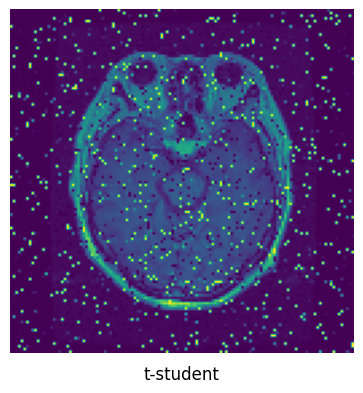

In [19]:
plt.figure(figsize=(6,4))
plt.imshow(image1)
plt.title(titles[0],y=-0.1)
plt.axis('off')
plt.tight_layout()
plt.savefig("/kaggle/working/t-student12.png")

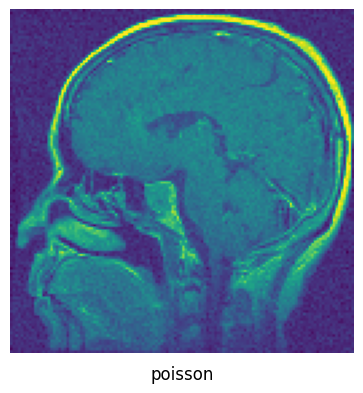

In [20]:
plt.figure(figsize=(6,4))
plt.imshow(image2)
plt.title(titles[1],y=-0.1)
plt.axis('off')
plt.tight_layout()

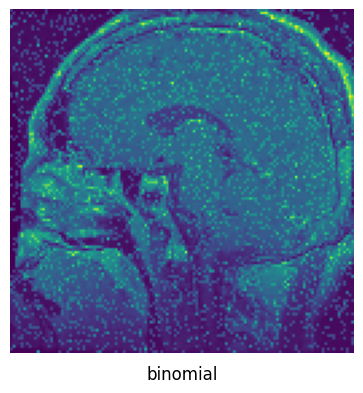

In [21]:
plt.figure(figsize=(6,4))
plt.imshow(image3)
plt.title(titles[2],y=-0.1)
plt.axis('off')
plt.tight_layout()

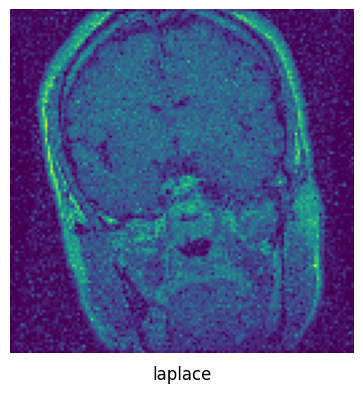

In [22]:
plt.figure(figsize=(6,4))
plt.imshow(image4)
plt.title(titles[3],y=-0.1)
plt.axis('off')
plt.tight_layout()

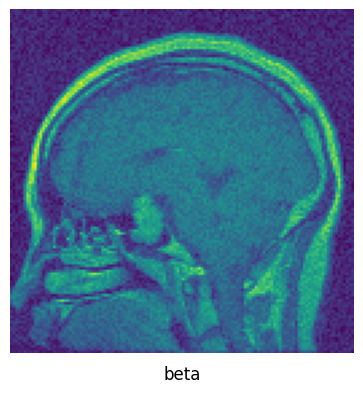

In [23]:
plt.figure(figsize=(6,4))
plt.imshow(image5)
plt.title(titles[4],y=-0.1)
plt.axis('off')
plt.tight_layout()

### f, axarr = plt.subplots(1,5, figsize=(5,5))
axarr[0].imshow(X_train[205])
axarr[0].set_axis_off()

axarr[1].imshow(X_Train_1[205])
axarr[1].set_axis_off()

axarr[1].imshow(X_Train_1[405])
axarr[1].set_axis_off()

axarr[1].imshow(X_Train_1[605])
axarr[1].set_axis_off()

axarr[1].imshow(X_Train_1[705])
axarr[1].set_axis_off()

In [24]:
# Concatenate training labels
y_Train = X_train1[:989]

# Concatenate testing labels
y_Test = X_train1[989:1319]

# Concatenate validation labels
y_val = X_train1[1319:]

In [25]:
y_Train.shape,y_Test.shape, y_val.shape

((989, 128, 128), (330, 128, 128), (330, 128, 128))

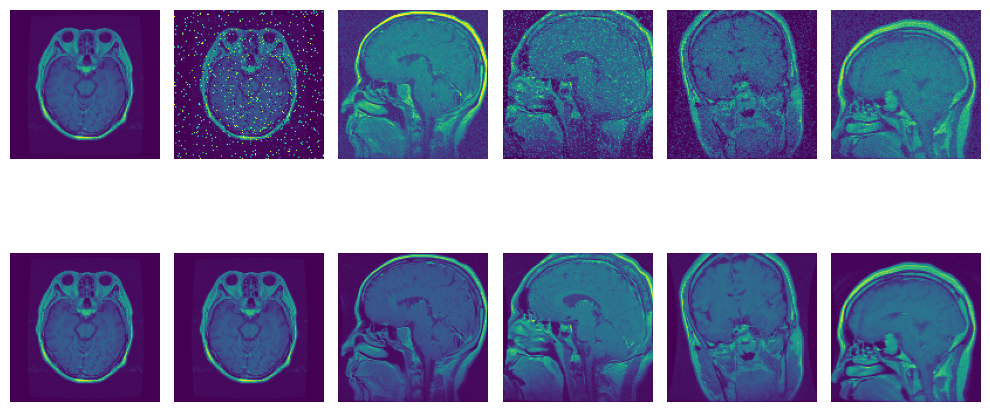

In [26]:
# Example: Create random images as NumPy arrays
# Replace these with your actual image arrays
image1  = X_train[5]
image2  = X_Train_1[5]
image3  = X_Train_1[205]
image4  = X_Train_1[405]
image5  = X_Train_1[605]
image6  = X_Train_1[805]
image7  = y_Train[5]
image8  = y_Train[5]
image9  = y_Train[205]
image10 = y_Train[405]
image11 = y_Train[605]
image12 = y_Train[805]

# List of image arrays
images = [image1, image2, image3, image4, image5, image6, image7, image8, image9, image10, image11, image12]

# Create a figure with a specified size
fig, axs = plt.subplots(2, 6, figsize=(10, 6))

# Flatten the axes array for easy iteration
axs = axs.flatten()

# Loop through the images and display them
for i, ax in enumerate(axs):
    if i < len(images):
        ax.imshow(images[i])
        ax.axis('off')  # Hide axes

# Hide any remaining empty subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Model 1

In [22]:
def create_model():
    tf.keras.backend.clear_session()

    input_0 = Input(shape=(128,128,1), name="input_layer")
    conv_layer_1 = Conv2D(filters=128, kernel_size=3, padding='same', name="conv_1")(input_0)
    conv_layer_2 = Conv2D(filters=128, kernel_size=3, padding='same', name="conv_2")(conv_layer_1)
    #conv_layer_3 = Conv2D(filters=128, kernel_size=3, padding='same', name="conv_3")(conv_layer_2)
    #conv_layer_4 = Conv2D(filters=128, kernel_size=3, padding='same', name="conv_4")(conv_layer_3)
    conv_layer_5 = Conv2D(filters=64, kernel_size=3, padding='same', name="conv_5")(conv_layer_2)

    deconv_layer_5 = Conv2DTranspose(filters=128, kernel_size=3, padding='same', name="deconv_5")(conv_layer_5)
    deconv_layer_5 = Add(name="add_1")([conv_layer_2, deconv_layer_5])
    deconv_layer_4 = Conv2DTranspose(filters=128, kernel_size=3, padding='same', name="deconv_4")(deconv_layer_5)
    #deconv_layer_3 = Conv2DTranspose(filters=128, kernel_size=3, padding='same', name="deconv_3")(deconv_layer_4)
    #deconv_layer_3 = Add(name="add_2")([conv_layer_2, deconv_layer_3])
    deconv_layer_2 = Conv2DTranspose(filters=64, kernel_size=3, padding='same', name="deconv_2")(deconv_layer_4)
    deconv_layer_1 = Conv2DTranspose(filters=1, kernel_size=3, padding='same', name="deconv_1")(deconv_layer_2)
    out = Add(name="add_3")([input_0, deconv_layer_1])

    model = Model(inputs=[input_0], outputs=[out])
    return model

In [ ]:
model_1 = create_model()
model_1.summary()

In [ ]:
tf.keras.utils.plot_model(model_1, to_file='model_plot_1.png', show_shapes=True, dpi=300)

In [ ]:
best_models_path = "/Brain_to_work/Best_Models/baseline_model/"
callbacks_lst_1 = [
    #tf.keras.callbacks.ModelCheckpoint(filepath=best_models_path+"best_REDNet_blindnoise_256x256.h5", save_freq=10, save_weights_only=False),
    #tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_lr=0.000009, min_delta=0.0001, factor=0.75, patience=3, verbose=1, mode='min'),
    tf.keras.callbacks.EarlyStopping(monitor='loss', verbose=1, min_delta=0.0001, patience=30)
]

In [ ]:
model_1.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(learning_rate=0.0001))
model_1.fit(X_Train,y_Train,validation_data=(X_val,y_val),
                        epochs=200,
                        verbose=1,
                        callbacks=callbacks_lst_1)

In [ ]:
predict_1 = model_1.predict(x_Test)

In [ ]:
predict_1.shape

In [ ]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[1021])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[35])
axarr[1].set_axis_off()

axarr[2].imshow(predict_1[35])
axarr[2].set_axis_off()

In [ ]:
save_path = '/kaggle/working/model_1.h5'
model_1.save(save_path)

# Model 1.1

In [27]:
input = Input(shape=(128, 128, 1))

#Noise estimation subnetwork
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(input)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(3, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)

#Non Blind denoising subnetwork
x = concatenate([x,input])
conv1 = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
conv2 = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv1)

pool1 = AveragePooling2D(pool_size=(2,2),padding='same')(conv2)
conv3 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(pool1)
conv4 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv3)
conv5 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv4)

pool2 = AveragePooling2D(pool_size=(2,2),padding='same')(conv5)
conv6 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(pool2)
conv7 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv6)
conv8 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv7)
conv9 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv8)
conv10 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv9)
conv11 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv10)

upsample1 = Conv2DTranspose(64, (3, 3), strides=2, activation="relu", kernel_initializer='he_normal',padding="same")(conv11)
add1 = Add()([upsample1,conv5])
conv12 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(add1)
conv13 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv12)
conv14 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv13)

upsample2 = Conv2DTranspose(32, (3, 3), strides=2, activation="relu", kernel_initializer='he_normal',padding="same")(conv14)
add1 = Add()([upsample2,conv2])
conv15 = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(add1)
conv16 = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv15)

out = Conv2D(1, (1,1), kernel_initializer='he_normal',padding="same")(conv16)
out = Add()([out,input])

model_11 = Model(input,out)
model_11.compile(optimizer=tf.keras.optimizers.Adam(1e-03), loss=tf.keras.losses.MeanSquaredError())

In [28]:
model_11.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        320 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      9,248 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │      9,248 │ conv2d_1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │        867 │ conv2d_3[0][0]    │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ conv2d_4[0][0],   │
│ (Concatenate)       │ 4)                │            │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │      1,184 │ concatenate[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 128, 128,  │      9,248 │ conv2d_5[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d   │ (None, 64, 64,    │          0 │ conv2d_6[0][0]    │
│ (AveragePooling2D)  │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 64, 64,    │     18,496 │ average_pooling2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 64, 64,    │     36,928 │ conv2d_7[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 64, 64,    │     36,928 │ conv2d_8[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ average_pooling2d_1 │ (None, 32, 32,    │          0 │ conv2d_9[0][0]    │
│ (AveragePooling2D)  │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 32, 32,    │     73,856 │ average_pooling2… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 32, 32,    │    147,584 │ conv2d_10[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 32, 32,    │    147,584 │ conv2d_11[0][0] 

 Total params: 1,165,060 (4.44 MB)

 Trainable params: 1,165,060 (4.44 MB)

 Non-trainable params: 0 (0.00 B)

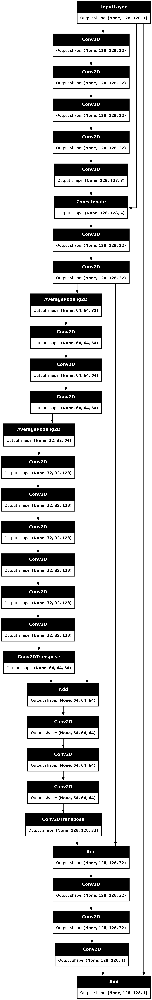

In [29]:
tf.keras.utils.plot_model(model_11, to_file='model_plot_1.1.png', show_shapes=True, dpi=300)

In [30]:
#best_models_path = "/content/drive/MyDrive/Brain_to_work/Best_Models/CBDNet/"
callbacks_lst_11 = [
    #tf.keras.callbacks.ModelCheckpoint(filepath=best_models_path+"CBDNet_256x256.h5", save_freq=10, save_weights_only=False),
    #tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_lr=0.000009, min_delta=0.0001, factor=0.75, patience=20, verbose=1, mode='min'),
    tf.keras.callbacks.EarlyStopping(monitor='loss', mode='min', verbose=1, min_delta=0.0001, patience=20)
]

In [31]:
model_11.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(learning_rate=0.0001))
history = model_11.fit(X_Train_1,y_Train,validation_data=(X_val,y_val),
                        epochs=500,
                        verbose=1,
                        callbacks=callbacks_lst_11)

Epoch 1/500


I0000 00:00:1748013458.893134      89 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


31/31 ━━━━━━━━━━━━━━━━━━━━ 55s 946ms/step - loss: 3315.0603 - val_loss: 1430.6304
Epoch 2/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - loss: 1182.6691 - val_loss: 1212.4656
Epoch 3/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 178ms/step - loss: 972.1287 - val_loss: 907.5471
Epoch 4/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 180ms/step - loss: 765.8585 - val_loss: 811.7982
Epoch 5/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 182ms/step - loss: 638.0971 - val_loss: 672.4868
Epoch 6/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 184ms/step - loss: 532.3062 - val_loss: 572.5494
Epoch 7/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step - loss: 501.7429 - val_loss: 514.4090
Epoch 8/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 188ms/step - loss: 429.5811 - val_loss: 478.3983
Epoch 9/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 189ms/step - loss: 415.6446 - val_loss: 540.7786
Epoch 10/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - loss: 372.1151 - val_loss: 439.2217
Epoch 11/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - loss: 356.5660 - val_loss: 374.6820
Epoc

In [32]:
predict_11 = model_11.predict(x_Test)

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step


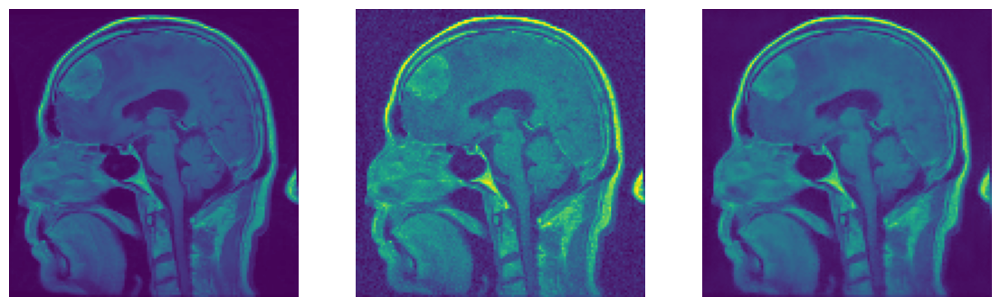

In [34]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[1059])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[70])
axarr[1].set_axis_off()

axarr[2].imshow(predict_11[70])
axarr[2].set_axis_off()

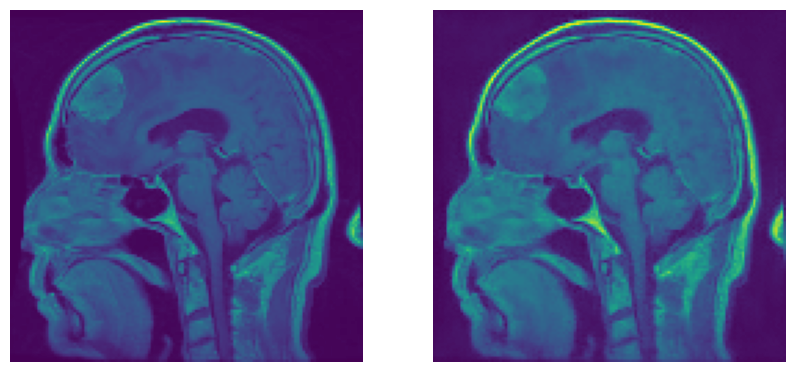

In [35]:
f, axarr = plt.subplots(1,2, figsize=(10,10))
axarr[0].imshow(X_train20[1059])
axarr[0].set_axis_off()

axarr[1].imshow(predict_11[70])
axarr[1].set_axis_off()

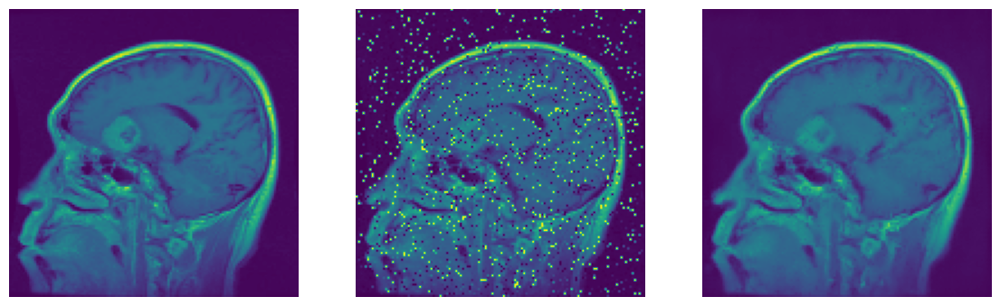

In [36]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[995])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[6])
axarr[1].set_axis_off()

axarr[2].imshow(predict_11[6])
axarr[2].set_axis_off()

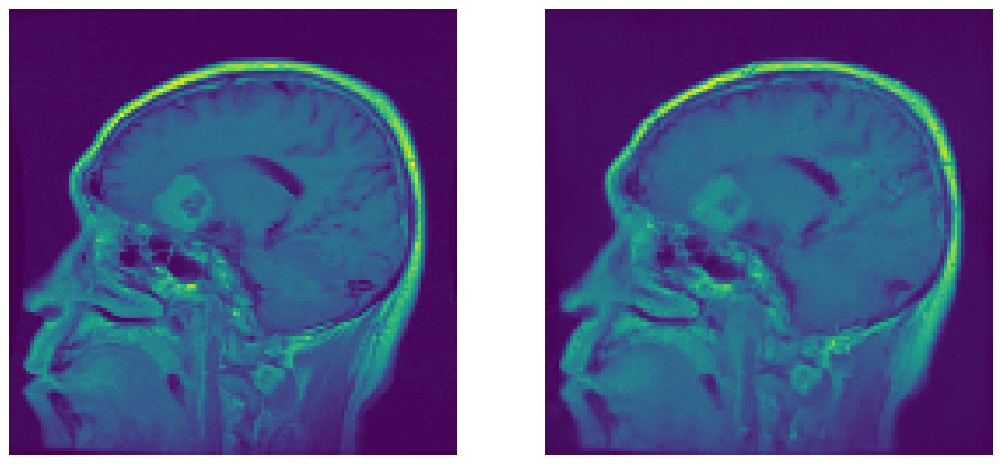

In [37]:
f, axarr = plt.subplots(1,2, figsize=(14,14))
axarr[0].imshow(X_train20[995])
axarr[0].set_axis_off()


axarr[1].imshow(predict_11[6])
axarr[1].set_axis_off()

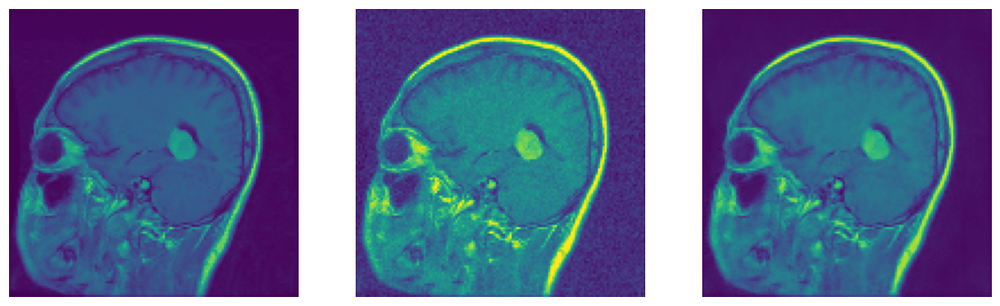

In [38]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[1061])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[72])
axarr[1].set_axis_off()

axarr[2].imshow(predict_11[72])
axarr[2].set_axis_off()

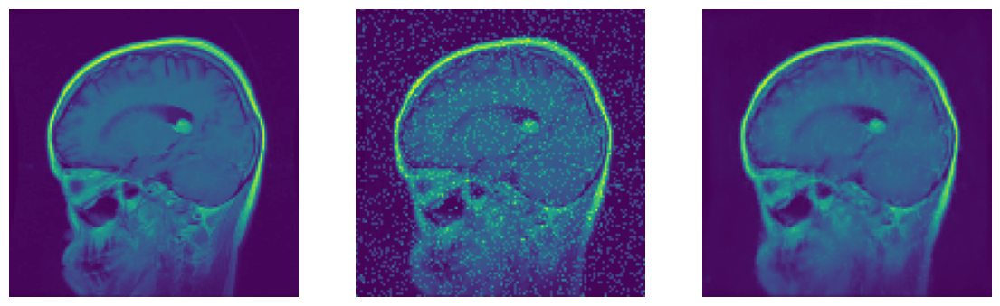

In [39]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[1130])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[141])
axarr[1].set_axis_off()

axarr[2].imshow(predict_11[141])
axarr[2].set_axis_off()

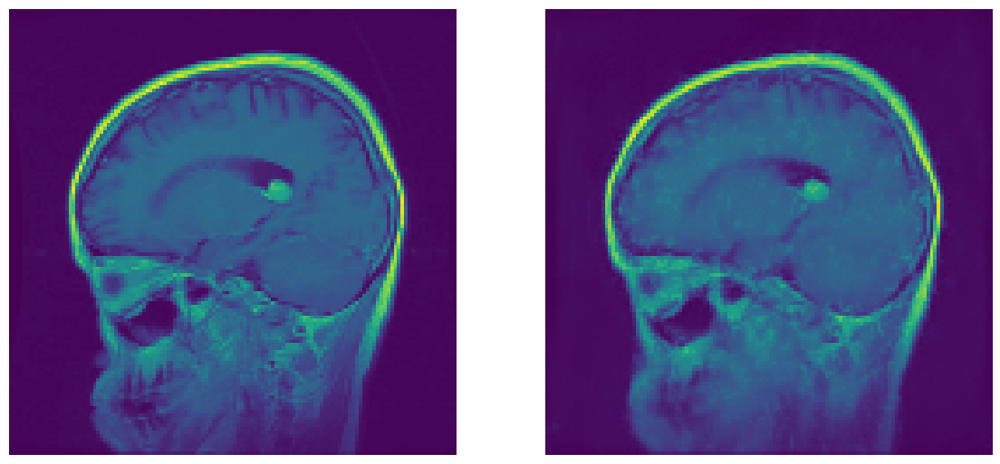

In [40]:
f, axarr = plt.subplots(1,2, figsize=(14,14))
axarr[0].imshow(X_train20[1130])
axarr[0].set_axis_off()

axarr[1].imshow(predict_11[141])
axarr[1].set_axis_off()

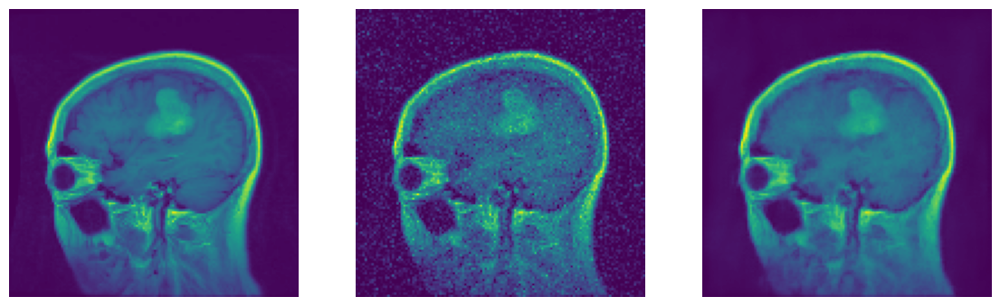

In [41]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[1200])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[211])
axarr[1].set_axis_off()

axarr[2].imshow(predict_11[211])
axarr[2].set_axis_off()

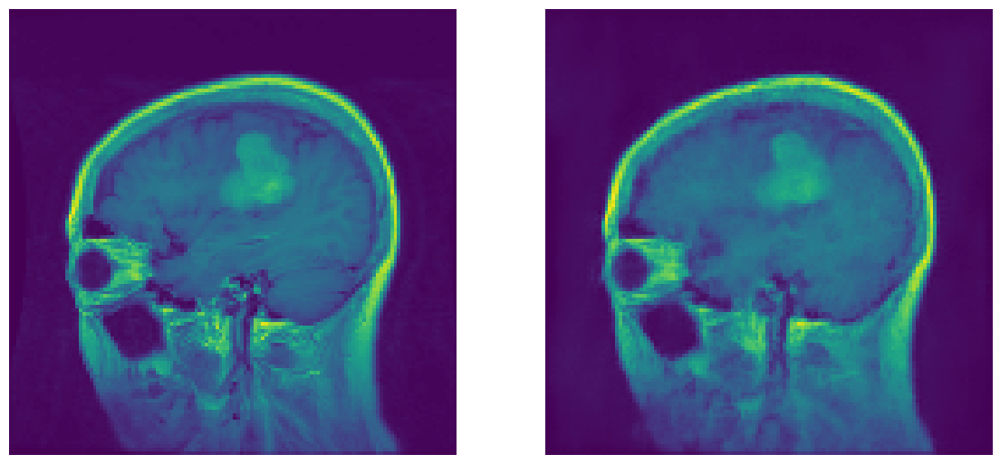

In [42]:
f, axarr = plt.subplots(1,2, figsize=(14,14))
axarr[0].imshow(X_train20[1200])
axarr[0].set_axis_off()

axarr[1].imshow(predict_11[211])
axarr[1].set_axis_off()

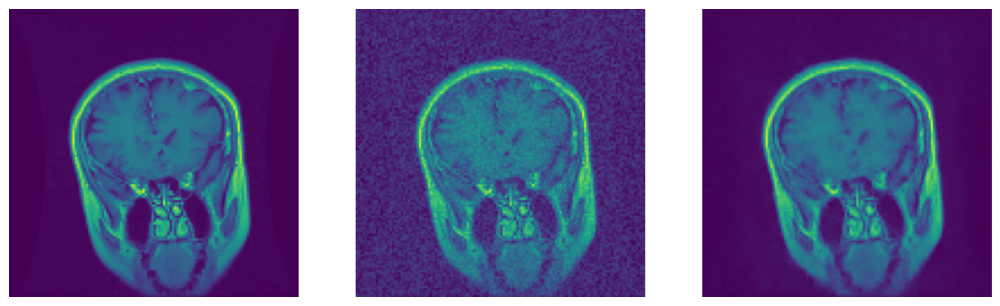

In [43]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[1267])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[278])
axarr[1].set_axis_off()

axarr[2].imshow(predict_11[278])
axarr[2].set_axis_off()

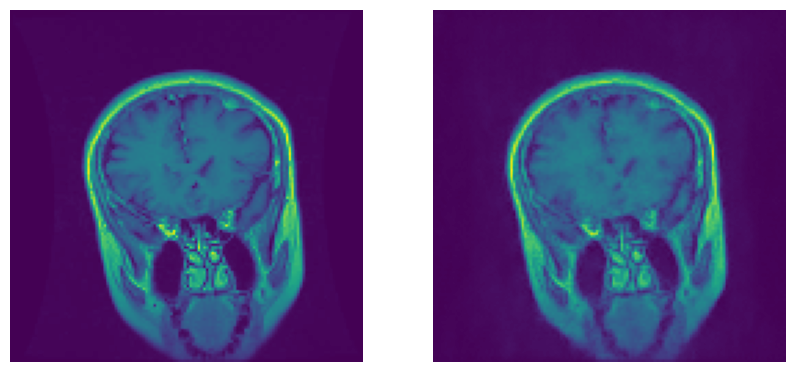

In [44]:
f, axarr = plt.subplots(1,2, figsize=(10,10))
axarr[0].imshow(X_train20[1267])
axarr[0].set_axis_off()

axarr[1].imshow(predict_11[278])
axarr[1].set_axis_off()

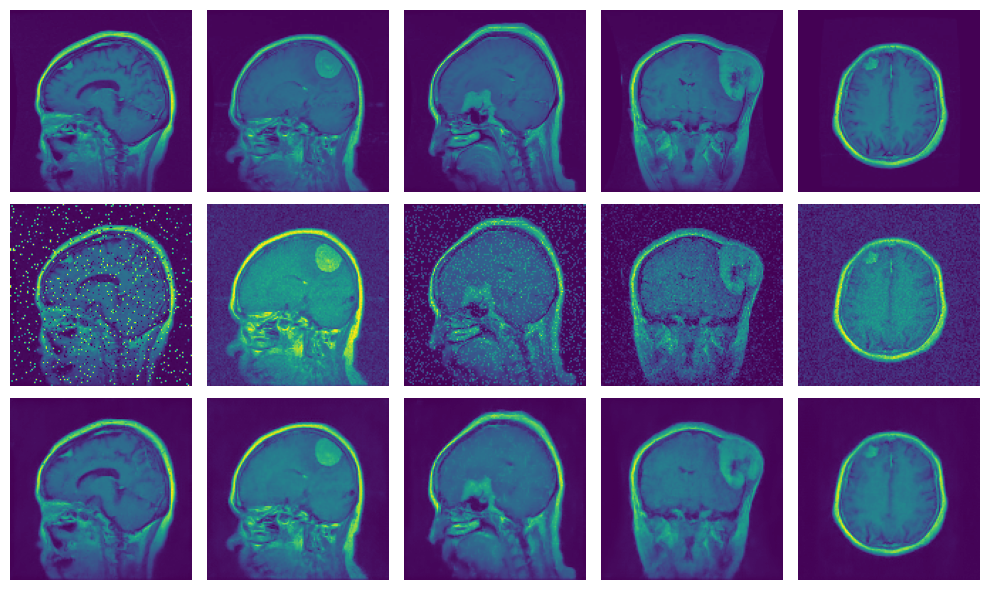

In [45]:
# Example: Create random images as NumPy arrays
# Replace these with your actual image arrays
image1 = X_train20[994]
image2 = X_train20[1060]
image3 = X_train20[1129]
image4 = X_train20[1199]
image5 = X_train20[1265]
image6 = x_Test[5]
image7 = x_Test[71]
image8 = x_Test[140]
image9 = x_Test[210]
image10 = x_Test[276]
image11 = predict_11[5]
image12 = predict_11[71]
image13 = predict_11[140]
image14 = predict_11[210]
image15 = predict_11[276]


# List of image arrays
images = [image1, image2, image3, image4, image5, image6,image7, image8, image9, image10, image11, image12,
         image13, image14, image15] #, image16, image17, image18]

# Create a figure with a specified size
fig, axs = plt.subplots(3, 5, figsize=(10, 6))

# Flatten the axes array for easy iteration
axs = axs.flatten()

# Loop through the images and display them
for i, ax in enumerate(axs):
    if i < len(images):
        ax.imshow(images[i])
        ax.axis('off')  # Hide axes

# Hide any remaining empty subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

In [46]:
import numpy as np
predict_squeezed = list()
for i in range(len(predict_11)):
    predict_squeezed.append(np.squeeze(predict_11[i]))  # Shape becomes (128, 128)
predict_12 =np.array(predict_squeezed)

In [47]:
 predict_12[1].shape

(128, 128)

In [48]:
def calculate_metrics(original, noised, denoised):
     # Calculate MSE
    mse = np.mean((original - denoised) ** 2)

    # Calculate PSNR
    if mse == 0:
        psnr = float('inf')  # No noise is present
    else:
        max_pixel = 255.0  # Adjust if your pixel range is different
        psnr = 10 * np.log10((max_pixel ** 2) / mse)

    # Calculate SSIM
    ssim_value = ssim(original, denoised, data_range=denoised.max() - denoised.min(), multichannel=True)

    return psnr, ssim_value, mse

In [49]:
metrics = list()
for i in range(len(x_Test)):
    arr_1 = np.array(calculate_metrics(X_train20[989+i],x_Test[i],predict_12[i]))
    metrics.append(arr_1)
metrics_arr = np.array(metrics)

In [50]:
import statistics
from statistics import mean,median,mode

## for psnr

In [51]:
print(np.std(metrics_arr[0:,0]), np.mean(metrics_arr[0:,0]), np.max(metrics_arr[0:,0]), np.min(metrics_arr[0:,0]))

2.8821670605764282 31.00391590961439 36.12768543483819 17.581490556678744


In [52]:
print(np.std(metrics_arr[0:65,0]), np.mean(metrics_arr[0:65,0]), np.max(metrics_arr[0:65,0]), np.min(metrics_arr[0:65,0]))
print(np.std(metrics_arr[65:131,0]), np.mean(metrics_arr[65:131,0]), np.max(metrics_arr[65:131,0]), np.min(metrics_arr[65:131,0]))
print(np.std(metrics_arr[131:197,0]), np.mean(metrics_arr[131:197,0]), np.max(metrics_arr[131:197,0]), np.min(metrics_arr[131:197,0]))
print(np.std(metrics_arr[197:263,0]), np.mean(metrics_arr[197:263,0]), np.max(metrics_arr[197:263,0]), np.min(metrics_arr[197:263,0]))
print(np.std(metrics_arr[263:329,0]), np.mean(metrics_arr[263:329,0]), np.max(metrics_arr[263:329,0]), np.min(metrics_arr[263:329,0]))

2.3940665556218677 30.326260935482722 36.12768543483819 23.884887065031478
4.541223067406902 31.567608680569457 35.86244933564933 17.581490556678744
1.9540278906258 30.17910773266619 33.74215832166442 23.50059432969315
1.869442565024178 30.535438828952827 34.52849013181152 23.960292363970808
2.088065980620375 32.37494602253231 35.61741693745659 25.130297512053783


In [53]:
stats = {
    'Distribution': ['Data_PSNR','t-student', 'poisson', 'binomial', 'laplace', 'beta'],
    'Standard Deviation': [
        np.std(metrics_arr[0:,0]),
        np.std(metrics_arr[0:65, 0]),
        np.std(metrics_arr[65:131, 0]),
        np.std(metrics_arr[131:197, 0]),
        np.std(metrics_arr[197:263, 0]),
        np.std(metrics_arr[263:329, 0])
    ],
    'Mean': [
        np.mean(metrics_arr[0:,0]),
        np.mean(metrics_arr[0:65, 0]),
        np.mean(metrics_arr[65:131, 0]),
        np.mean(metrics_arr[131:197, 0]),
        np.mean(metrics_arr[197:263, 0]),
        np.mean(metrics_arr[263:329, 0])
    ],
    'Max': [
        np.max(metrics_arr[0:,0]),
        np.max(metrics_arr[0:65, 0]),
        np.max(metrics_arr[65:131, 0]),
        np.max(metrics_arr[131:197, 0]),
        np.max(metrics_arr[197:263, 0]),
        np.max(metrics_arr[263:329, 0])
    ],
    'Min': [
        np.min(metrics_arr[0:,0]),
        np.min(metrics_arr[0:65, 0]),
        np.min(metrics_arr[65:131, 0]),
        np.min(metrics_arr[131:197, 0]),
        np.min(metrics_arr[197:263, 0]),
        np.min(metrics_arr[263:329, 0])
    ]
}

# Create a DataFrame
df = pd.DataFrame(stats)

# Print the DataFrame
print(df)

  Distribution  Standard Deviation       Mean        Max        Min
0    Data_PSNR            2.882167  31.003916  36.127685  17.581491
1    t-student            2.394067  30.326261  36.127685  23.884887
2      poisson            4.541223  31.567609  35.862449  17.581491
3     binomial            1.954028  30.179108  33.742158  23.500594
4      laplace            1.869443  30.535439  34.528490  23.960292
5         beta            2.088066  32.374946  35.617417  25.130298


## for ssim

In [54]:
np.std(metrics_arr[0:,1]), np.mean(metrics_arr[0:,1]), np.max(metrics_arr[0:,1])

(0.028533863735983038, 0.8949462760781072, 0.9459802723709233)

In [55]:
stats = {
    'Distribution': ['Data_SSIM','t-student', 'poisson', 'binomial', 'laplace', 'beta'],
    'Standard Deviation': [
        np.std(metrics_arr[0:,1]),
        np.std(metrics_arr[0:65, 1]),
        np.std(metrics_arr[65:131, 1]),
        np.std(metrics_arr[131:197, 1]),
        np.std(metrics_arr[197:263, 1]),
        np.std(metrics_arr[263:329, 1])
    ],
    'Mean': [
        np.mean(metrics_arr[0:,1]),
        np.mean(metrics_arr[0:65, 1]),
        np.mean(metrics_arr[65:131, 1]),
        np.mean(metrics_arr[131:197, 1]),
        np.mean(metrics_arr[197:263, 1]),
        np.mean(metrics_arr[263:329, 1])
    ],
    'Max': [
        np.max(metrics_arr[0:,1]),
        np.max(metrics_arr[0:65, 1]),
        np.max(metrics_arr[65:131, 1]),
        np.max(metrics_arr[131:197, 1]),
        np.max(metrics_arr[197:263, 1]),
        np.max(metrics_arr[263:329, 1])
    ],
    'Min': [
        np.min(metrics_arr[0:,1]),
        np.min(metrics_arr[0:65, 1]),
        np.min(metrics_arr[65:131, 1]),
        np.min(metrics_arr[131:197, 1]),
        np.min(metrics_arr[197:263, 1]),
        np.min(metrics_arr[263:329, 1])
    ]
}

# Create a DataFrame
df = pd.DataFrame(stats)

# Print the DataFrame
print(df)

  Distribution  Standard Deviation      Mean       Max       Min
0    Data_SSIM            0.028534  0.894946  0.945980  0.789127
1    t-student            0.020594  0.897794  0.927182  0.829317
2      poisson            0.038810  0.901447  0.945980  0.795459
3     binomial            0.025546  0.889239  0.934652  0.805278
4      laplace            0.020844  0.883584  0.913818  0.799756
5         beta            0.028048  0.902424  0.933417  0.789127


## for mse

In [56]:
np.std(metrics_arr[0:,2]), np.mean(metrics_arr[0:,2]), np.max(metrics_arr[0:,2])

(106.9948445857435, 71.5473780371926, 1134.831298828125)

In [57]:
stats = {
    'Distribution': ['Data_MSE','t-student', 'poisson', 'binomial', 'laplace', 'beta'],
    'Standard Deviation': [
        np.std(metrics_arr[0:,2]),
        np.std(metrics_arr[0:65, 2]),
        np.std(metrics_arr[65:131, 2]),
        np.std(metrics_arr[131:197, 2]),
        np.std(metrics_arr[197:263, 2]),
        np.std(metrics_arr[263:329, 2])
    ],
    'Mean': [
        np.mean(metrics_arr[0:,2]),
        np.mean(metrics_arr[0:65, 2]),
        np.mean(metrics_arr[65:131, 2]),
        np.mean(metrics_arr[131:197, 2]),
        np.mean(metrics_arr[197:263, 2]),
        np.mean(metrics_arr[263:329, 2])
    ],
    'Max': [
        np.max(metrics_arr[0:,2]),
        np.max(metrics_arr[0:65, 2]),
        np.max(metrics_arr[65:131, 2]),
        np.max(metrics_arr[131:197, 2]),
        np.max(metrics_arr[197:263, 2]),
        np.max(metrics_arr[263:329, 2])
    ],
    'Min': [
        np.min(metrics_arr[0:,2]),
        np.min(metrics_arr[0:65, 2]),
        np.min(metrics_arr[65:131, 2]),
        np.min(metrics_arr[131:197, 2]),
        np.min(metrics_arr[197:263, 2]),
        np.min(metrics_arr[263:329, 2])
    ]
}

# Create a DataFrame
df = pd.DataFrame(stats)
# Print the DataFrame
print(df)

  Distribution  Standard Deviation        Mean          Max        Min
0     Data_MSE          106.994845   71.547378  1134.831299  15.860315
1    t-student           49.578734   71.561889   265.822449  15.860315
2      poisson          220.063792  109.137400  1134.831299  16.859140
3     binomial           42.597985   70.267638   290.416260  27.470371
4      laplace           37.833579   64.123998   261.246887  22.920883
5         beta           29.172114   43.203158   199.549484  17.837692


In [58]:
font = {'family': 'Times New Roman',
        'color':  'black',
        'weight': 'normal',
        'size': 16,
        }

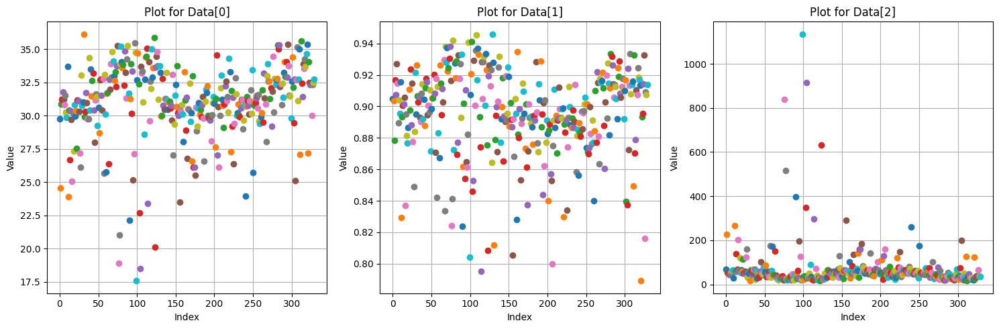

In [59]:
# Example data: Create a sample array of shape (n, 3, 1)
n = len(x_Test)  # Number of arrays
data = metrics_arr

# Prepare the data for plotting
x_values = np.arange(n)  # X-axis values (0 to n-1)

# Create three plots
plt.figure(figsize=(15, 5))

# Plot 1
plt.subplot(1, 3, 1)
for i in range(n):
    plt.plot(x_values[i], data[0:,0][i], 'o-', label=f'Array {i+1}')
plt.title('Plot for Data[0]')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

# Plot 2
plt.subplot(1, 3, 2)
for i in range(n):
    plt.plot(x_values[i], data[0:,1][i], 'o-', label=f'Array {i+1}')
plt.title('Plot for Data[1]')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

# Plot 3
plt.subplot(1, 3, 3)
for i in range(n):
    plt.plot(x_values[i], data[0:,2][i], 'o-', label=f'Array {i+1}')
plt.title('Plot for Data[2]')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

# Adjust layout
plt.tight_layout()
plt.show()

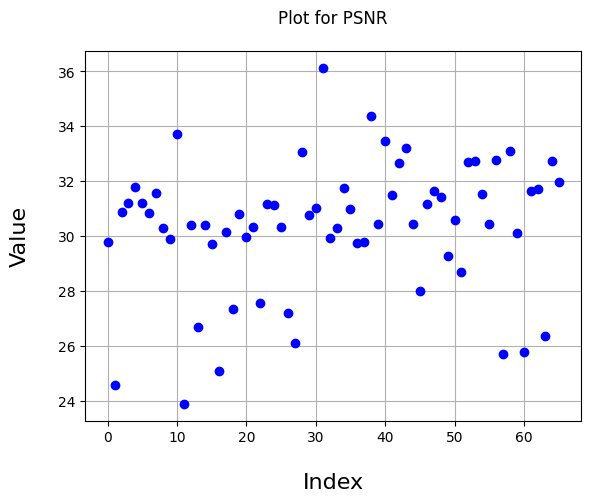

In [66]:
for i in range(66): # for the distribution 1
    plt.plot(x_values[i], data[0:,0][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for PSNR', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

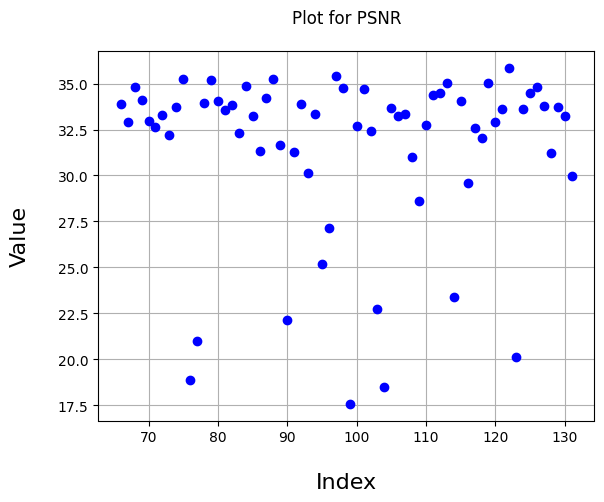

In [79]:
for i in range(66,132): # for the distribution 2
    plt.plot(x_values[i], data[0:,0][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for PSNR', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

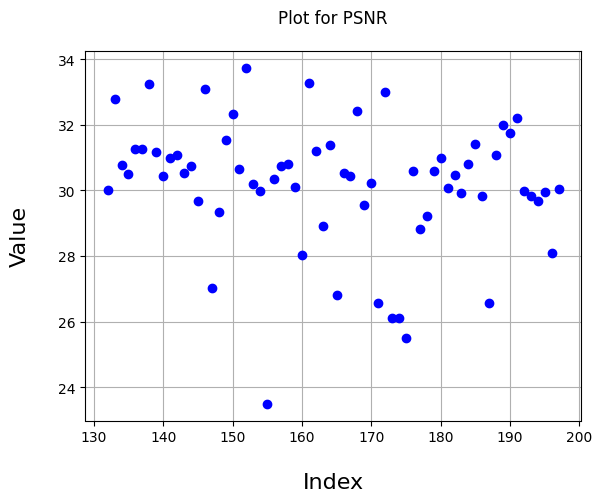

In [78]:
for i in range(132,198): # for the distribution 3
    plt.plot(x_values[i], data[0:,0][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for PSNR', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

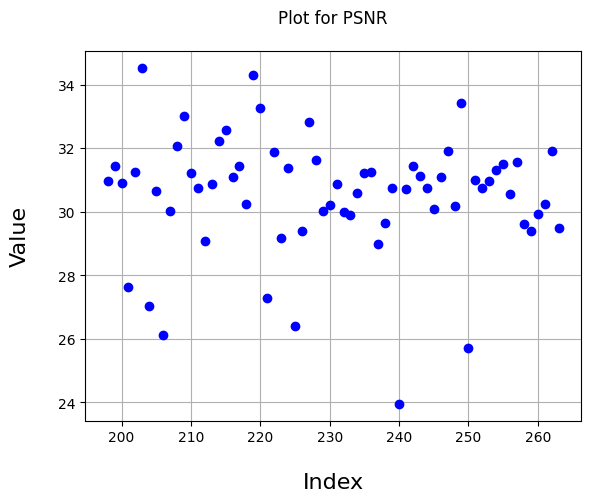

In [77]:
for i in range(198, 264): # for the distribution 4
    plt.plot(x_values[i], data[0:,0][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for PSNR', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

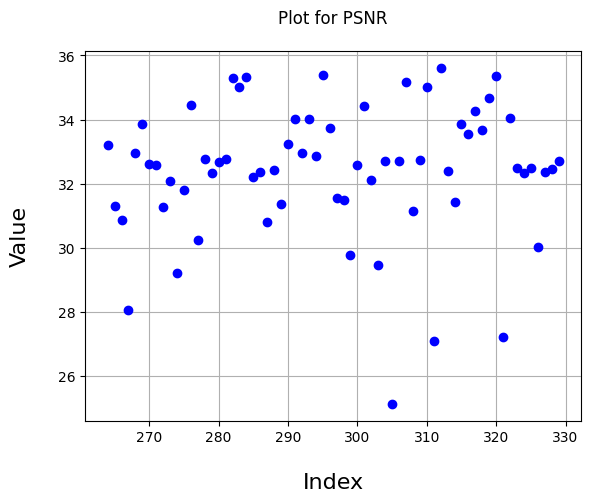

In [76]:
for i in range(264, 330): # for the distribution 5
    plt.plot(x_values[i], data[0:,0][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for PSNR', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

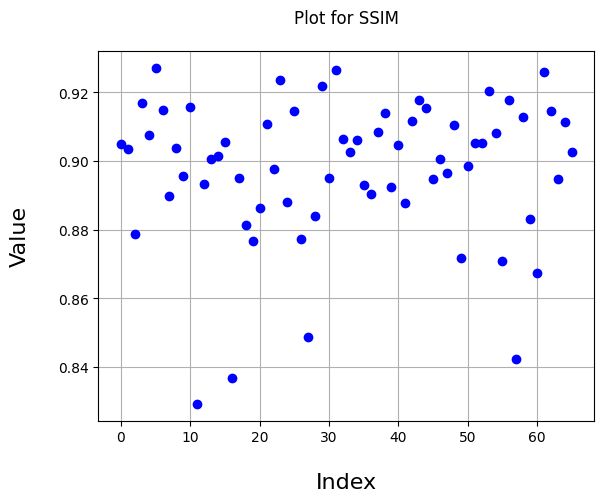

In [131]:
for i in range(66): # for the distribution 1
    plt.plot(x_values[i], data[0:,1][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for SSIM', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

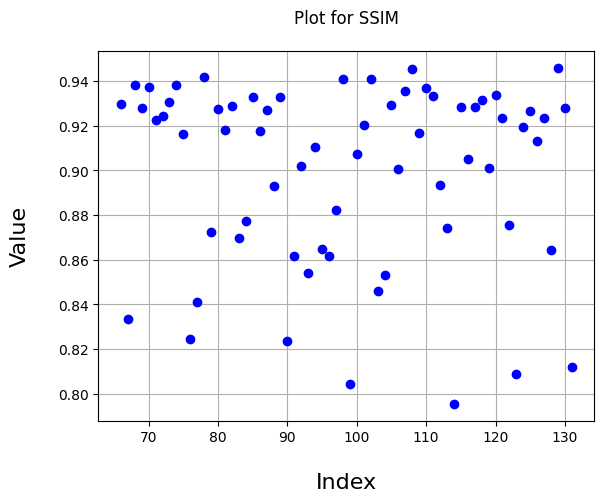

In [134]:
for i in range(66,132): # for the distribution 2
    plt.plot(x_values[i], data[0:,1][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for SSIM', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

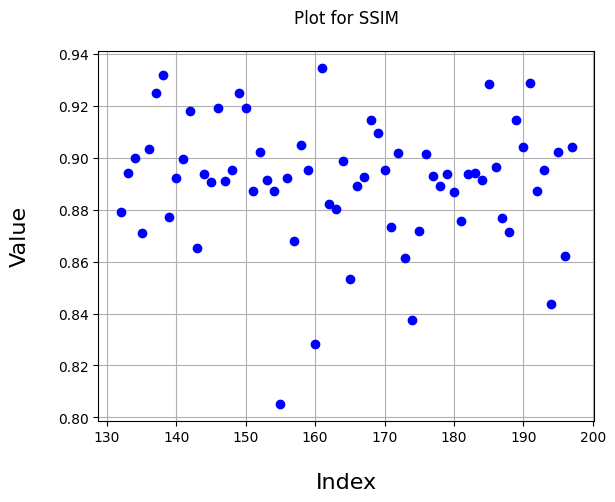

In [135]:
for i in range(132,198): # for the distribution 3
    plt.plot(x_values[i], data[0:,1][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for SSIM', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

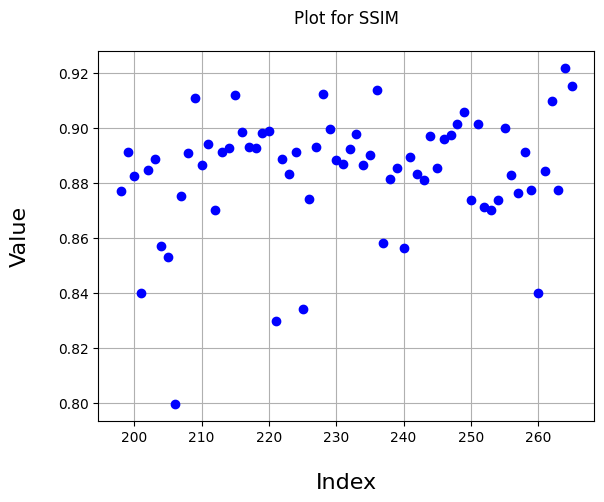

In [137]:
for i in range(198,266): # for the distribution 4
    plt.plot(x_values[i], data[0:,1][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for SSIM', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

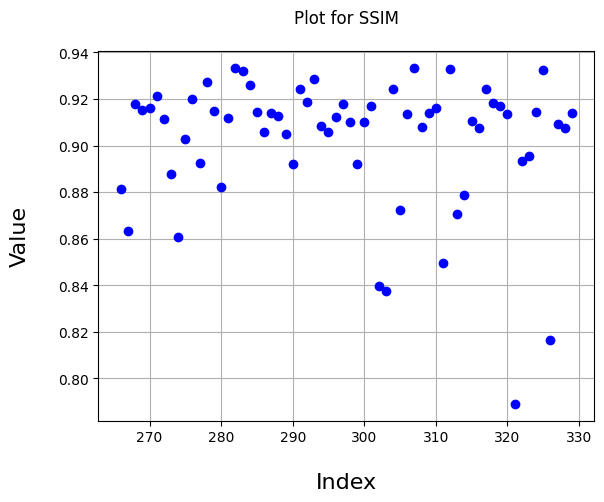

In [138]:
for i in range(266,330): # for the distribution 5
    plt.plot(x_values[i], data[0:,1][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for SSIM', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

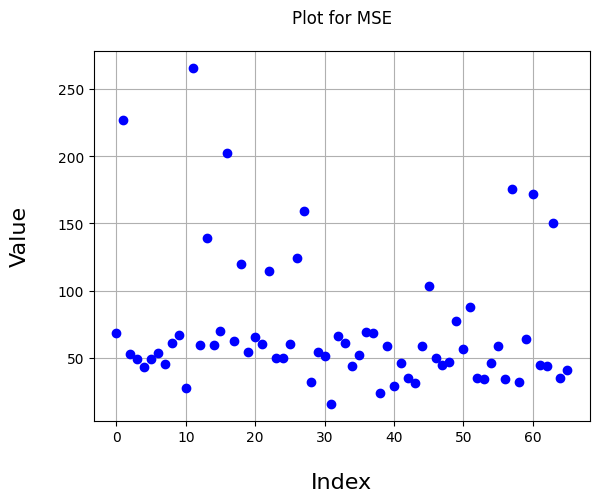

In [139]:
for i in range(66): # for the distribution 1
    plt.plot(x_values[i], data[0:,2][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for MSE', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

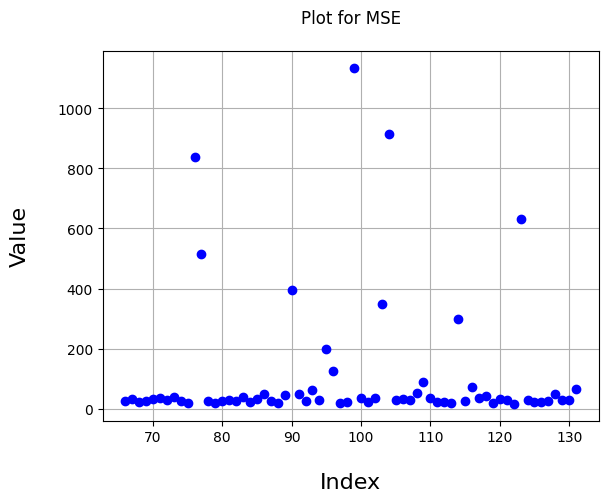

In [140]:
for i in range(66,132): # for the distribution 2
    plt.plot(x_values[i], data[0:,2][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for MSE', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

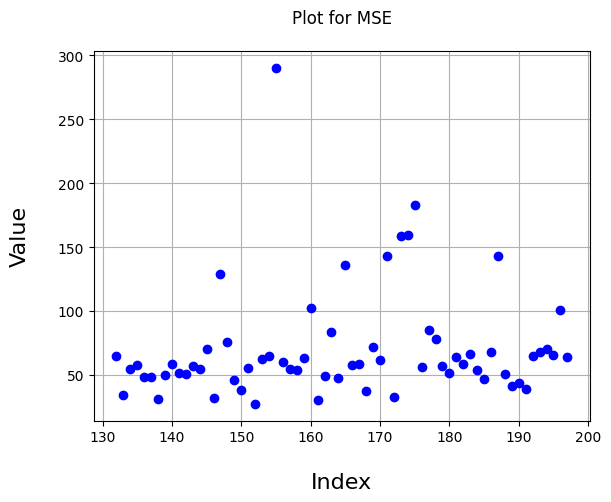

In [142]:
for i in range(132,198): # for the distribution 3
    plt.plot(x_values[i], data[0:,2][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for MSE', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

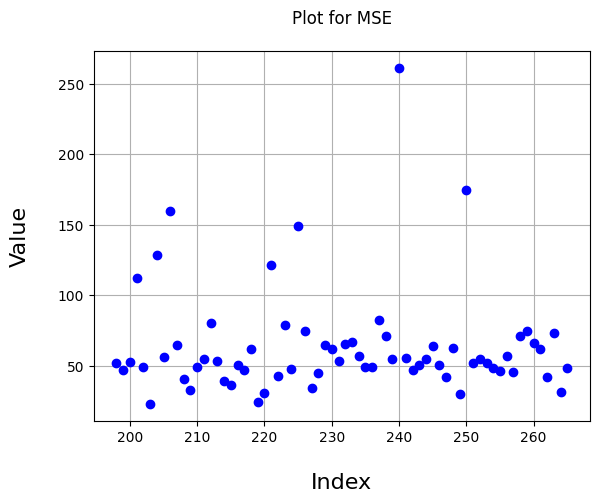

In [143]:
for i in range(198,266): # for the distribution 4
    plt.plot(x_values[i], data[0:,2][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for MSE', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

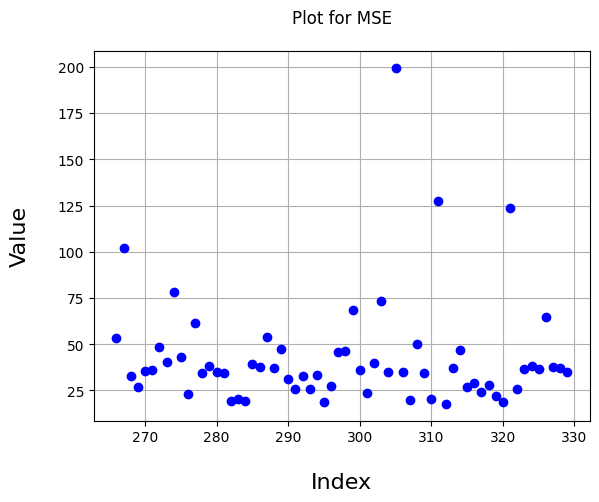

In [144]:
for i in range(266,330): # for the distribution 5
    plt.plot(x_values[i], data[0:,2][i], 'o-', color='blue', label=f'Array {i+1}')
plt.title('Plot for MSE', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

In [63]:
x_Test.shape

(330, 128, 128)

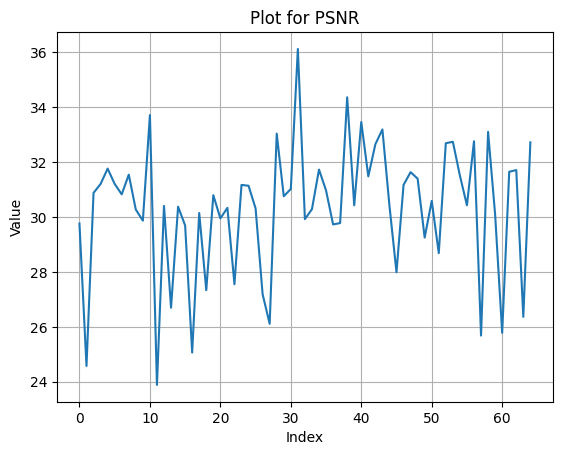

In [113]:
#for distribution 1
plt.plot( data[0:,0][:65])
plt.title('Plot for PSNR')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

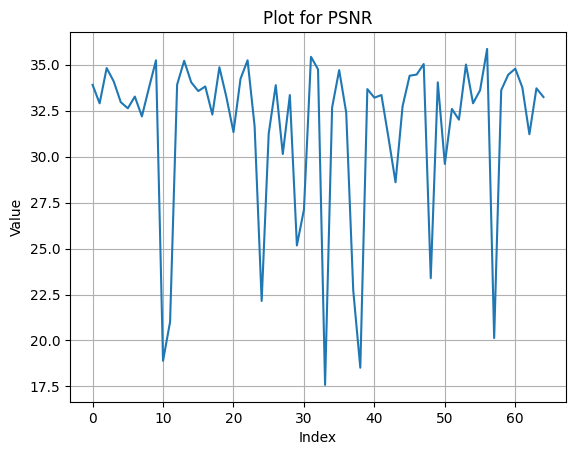

In [114]:
#for distribution 2
plt.plot( data[0:,0][66:131])
plt.title('Plot for PSNR')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

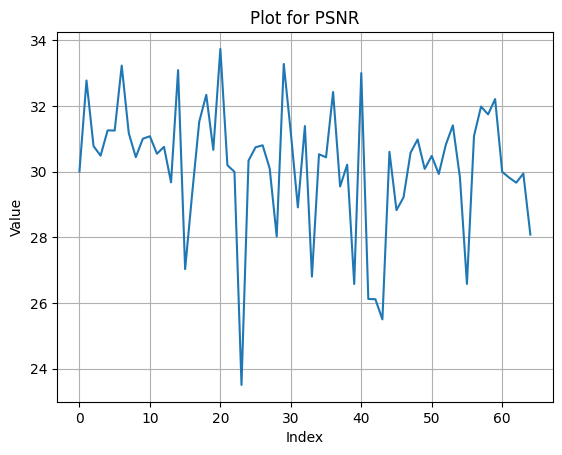

In [115]:
#for distribution 3
plt.plot( data[0:,0][132:197])
plt.title('Plot for PSNR')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

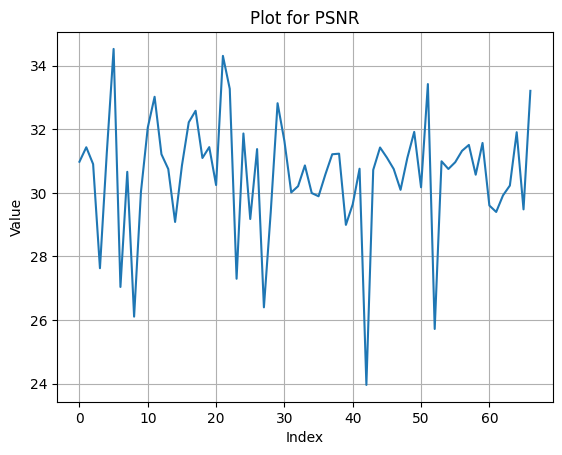

In [116]:
#for distribution 4
plt.plot( data[0:,0][198:265])
plt.title('Plot for PSNR')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

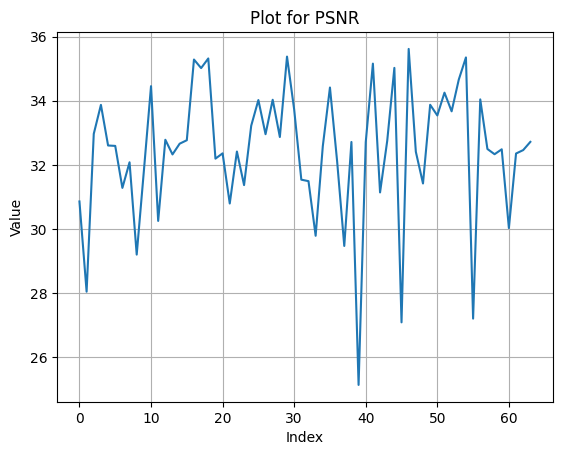

In [117]:
#for distribution 5
plt.plot( data[0:,0][266:330])
plt.title('Plot for PSNR')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

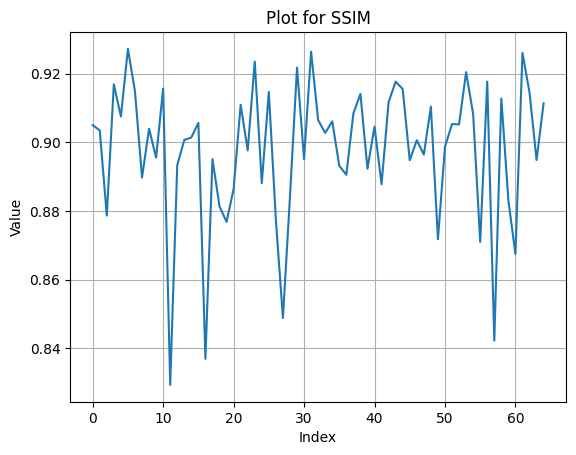

In [118]:
#for distribution 1
plt.plot( data[0:,1][0:65])
plt.title('Plot for SSIM')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

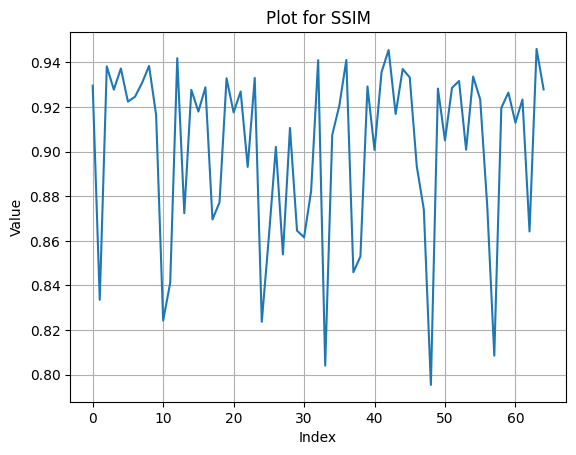

In [119]:
#for distribution 2
plt.plot( data[0:,1][66:131])
plt.title('Plot for SSIM')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

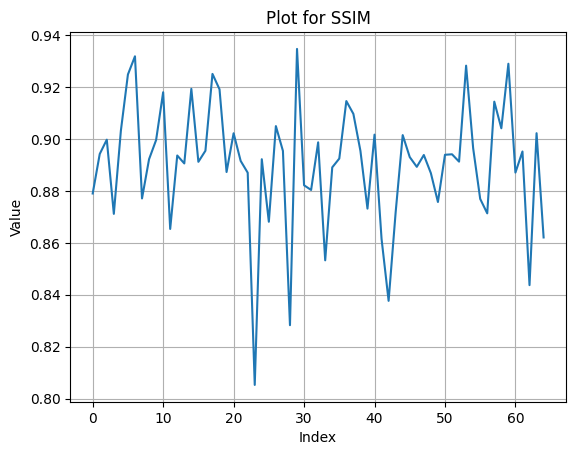

In [120]:
#for distribution 3
plt.plot( data[0:,1][132:197])
plt.title('Plot for SSIM')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

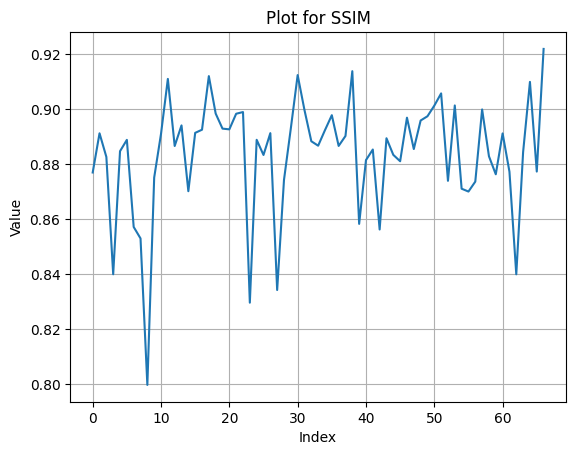

In [121]:
#for distribution 4
plt.plot( data[0:,1][198:265])
plt.title('Plot for SSIM')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

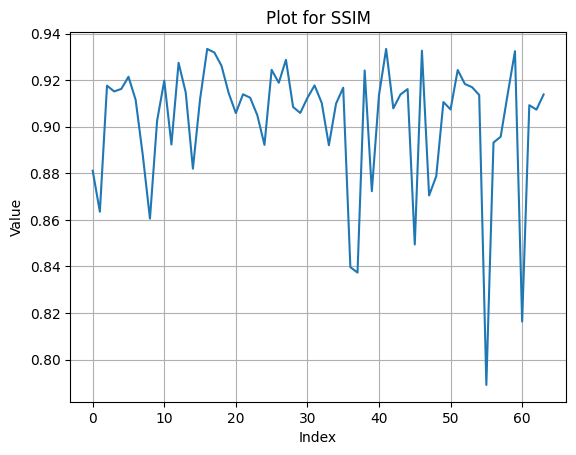

In [122]:
#for distribution 1
plt.plot( data[0:,1][266:330])
plt.title('Plot for SSIM')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

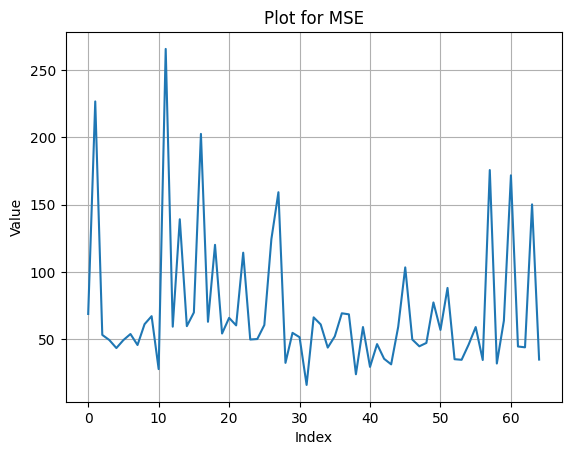

In [124]:
#for distribution 1
plt.plot( data[0:,2][0:65])
plt.title('Plot for MSE')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

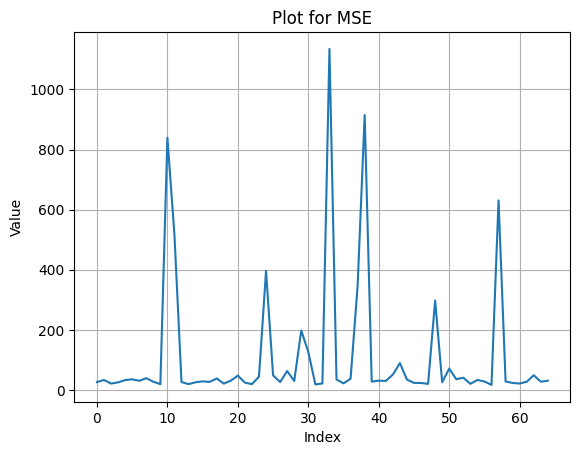

In [126]:
#for distribution 2
plt.plot( data[0:,2][66:131])
plt.title('Plot for MSE')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

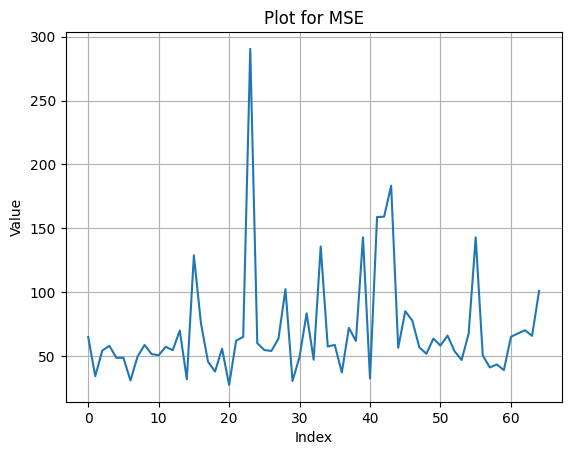

In [127]:
#for distribution 3
plt.plot( data[0:,2][132:197])
plt.title('Plot for MSE')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

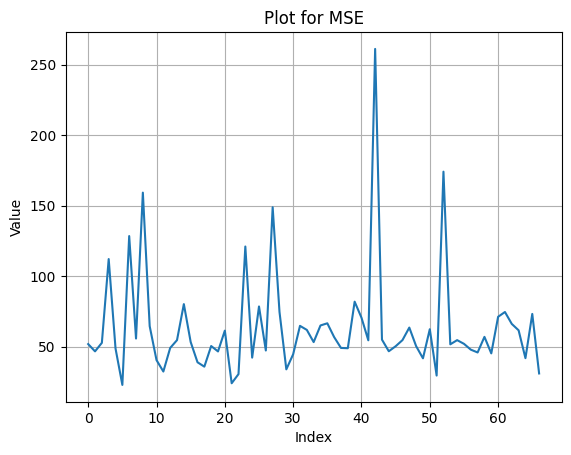

In [129]:
#for distribution 4
plt.plot( data[0:,2][198:265])
plt.title('Plot for MSE')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

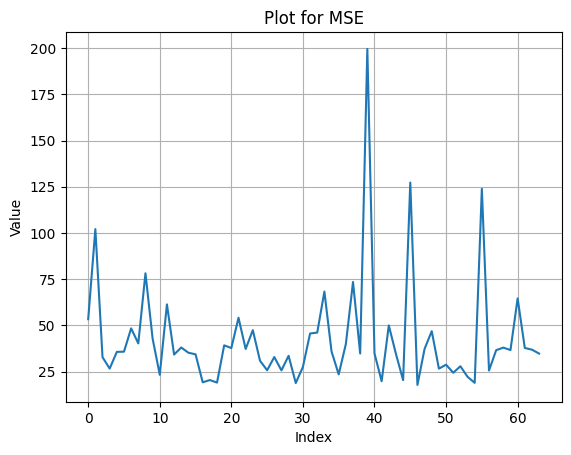

In [130]:
#for distribution 5
plt.plot( data[0:,2][266:330])
plt.title('Plot for MSE')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid()

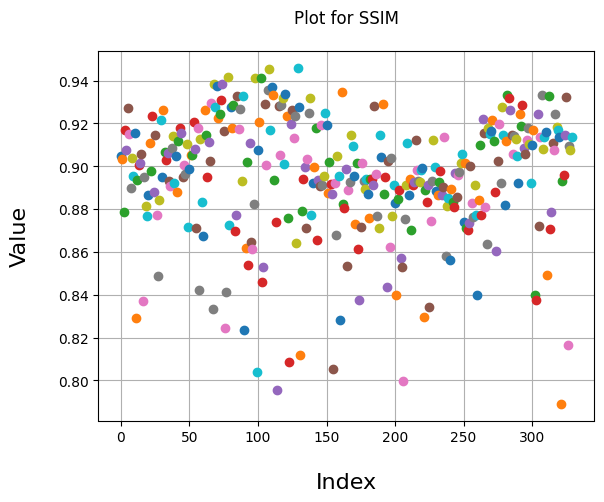

In [102]:
for i in range(n):
    plt.plot(x_values[i], data[0:,1][i], 'o-', label=f'Array {i+1}')
plt.title('Plot for SSIM',pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

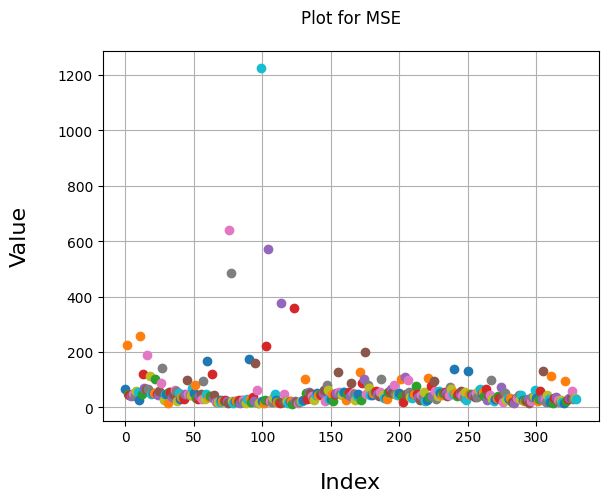

In [132]:
for i in range(n):
    plt.plot(x_values[i], data[0:,2][i], 'o-', label=f'Array {i+1}')
plt.title('Plot for MSE', pad=20.0)
plt.xlabel('Index', labelpad=20.0, fontdict=font)
plt.ylabel('Value', labelpad=20.0, fontdict=font)
plt.grid()

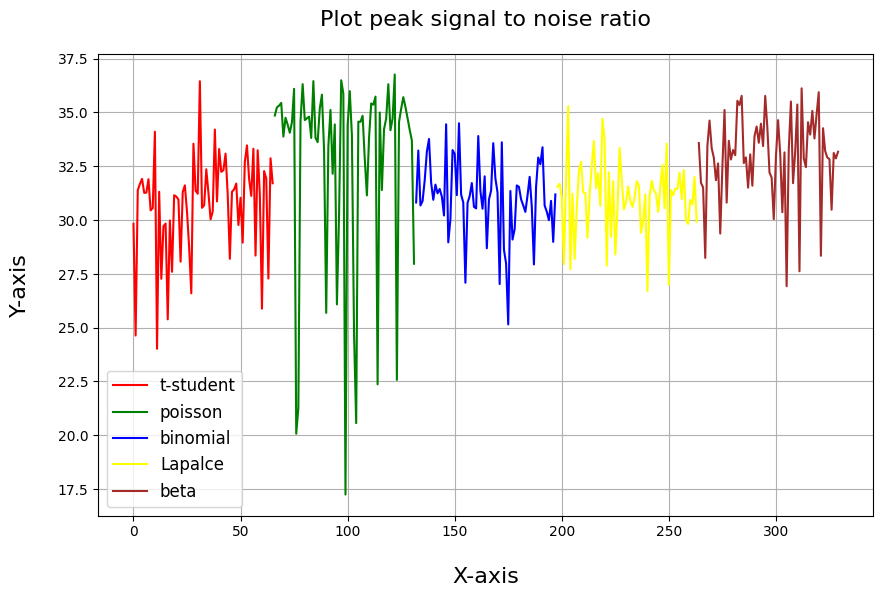

In [156]:
# Create a figure
plt.figure(figsize=(10, 6))

# Define color ranges
colors = ['red', 'green', 'blue', 'yellow', 'brown']
ranges = [(0, 66), (66, 132), (132, 198), (198, 264), (264, 330)]  # Index ranges (0-30, 30-70, 70-100)
prob = ['t-student','poisson','binomial','Lapalce','beta']

# Plot each segment with a different color
for i, (start, end) in enumerate(ranges):
    plt.plot(x_values[start:end], data[0:,0][start:end], color=colors[i], label=f'{prob[i]}')

# Add titles and labels
plt.title('Plot peak signal to noise ratio', pad=20.0, fontdict=font)
plt.xlabel('X-axis', labelpad=20.0, fontdict=font)
plt.ylabel('Y-axis', labelpad=20.0, fontdict=font)

# Add legend
plt.legend(fontsize=12)

# Show grid
plt.grid()

# Show the plot
plt.show()

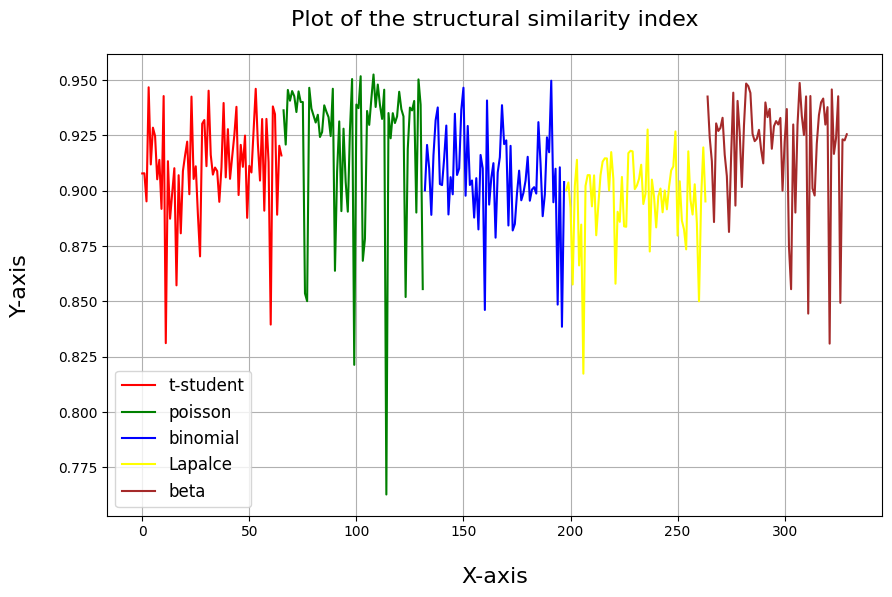

In [155]:
# Create a figure
plt.figure(figsize=(10, 6))

# Define color ranges
colors = ['red', 'green', 'blue', 'yellow', 'brown']
ranges = [(0, 66), (66, 132), (132, 198), (198, 264), (264, 330)]  # Index ranges (0-30, 30-70, 70-100)
prob = ['t-student','poisson','binomial','Lapalce','beta']

# Plot each segment with a different color
for i, (start, end) in enumerate(ranges):
    plt.plot(x_values[start:end], data[0:,1][start:end], color=colors[i], label=f'{prob[i]}')

# Add titles and labels
plt.title('Plot of the structural similarity index',pad=20.0, fontdict=font)
plt.xlabel('X-axis', labelpad=20.0, fontdict=font)
plt.ylabel('Y-axis', labelpad=20.0, fontdict=font)

# Add legend
plt.legend(fontsize=12)

# Show grid
plt.grid()

# Show the plot
plt.show()

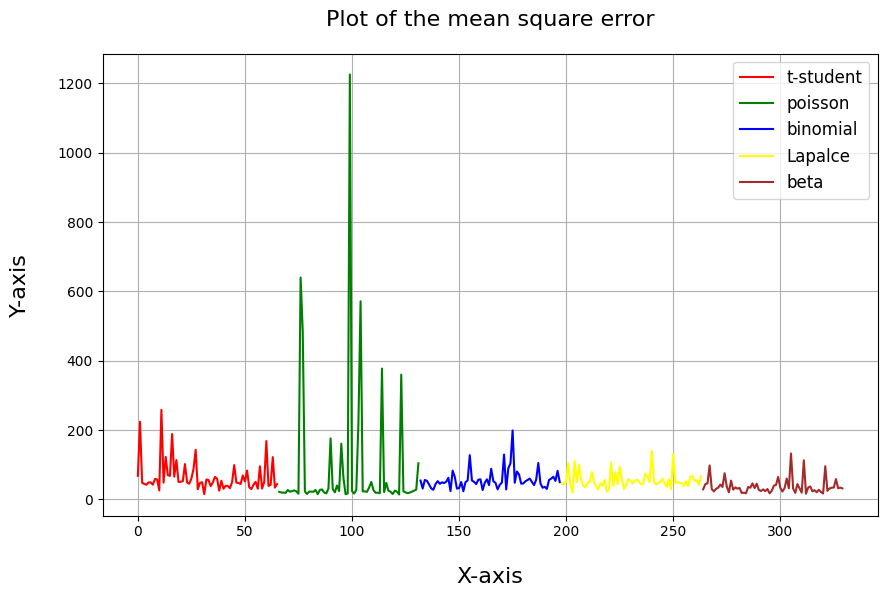

In [154]:
# Create a figure
plt.figure(figsize=(10, 6))

# Define color ranges
colors = ['red', 'green', 'blue', 'yellow', 'brown']
ranges = [(0, 66), (66, 132), (132, 198), (198, 264), (264, 330)]  # Index ranges (0-30, 30-70, 70-100)
prob = ['t-student','poisson','binomial','Lapalce','beta']

# Plot each segment with a different color
for i, (start, end) in enumerate(ranges):
    plt.plot(x_values[start:end], data[0:,2][start:end], color=colors[i], label=f'{prob[i]}')

# Add titles and labels
plt.title('Plot of the mean square error',pad=20.0, fontdict=font)
plt.xlabel('X-axis', labelpad=20.0, fontdict=font)
plt.ylabel('Y-axis', labelpad=20.0, fontdict=font)

# Add legend
plt.legend(fontsize=12)

# Show grid
plt.grid()

# Show the plot
plt.show()

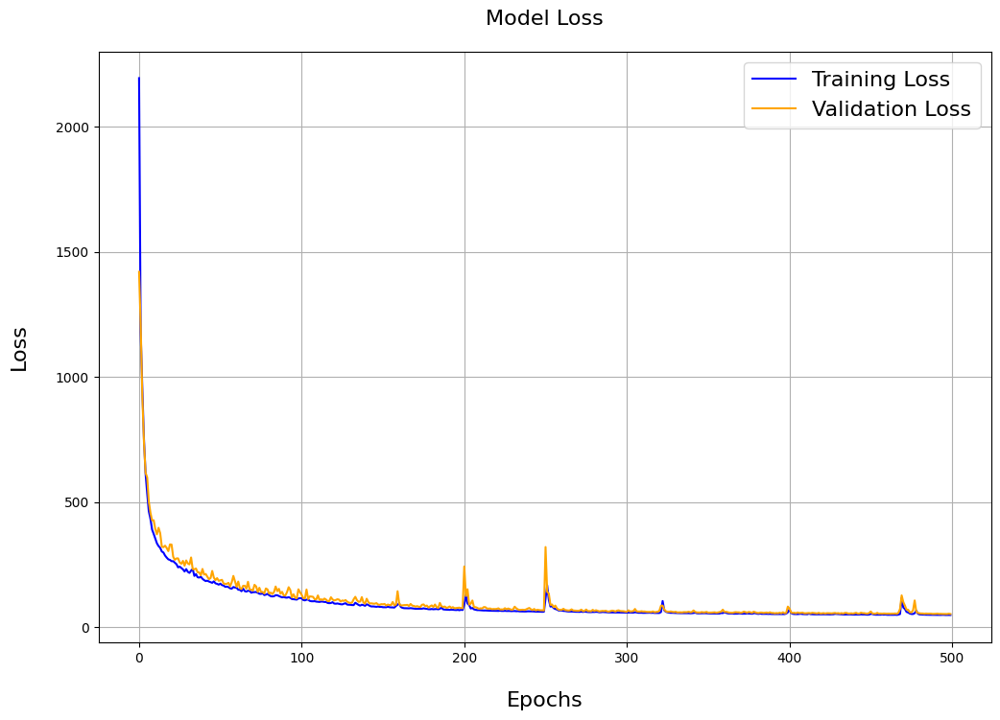

In [151]:
plt.figure(figsize=(12, 8))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
plt.title('Model Loss',pad=20.0, fontdict=font)
plt.xlabel('Epochs',labelpad=20.0, fontdict=font)
plt.ylabel('Loss',labelpad=20.0, fontdict=font)
plt.legend(fontsize=16)
plt.grid(True)
plt.show()

In [ ]:
save_path_11 = '/kaggle/working/model_11.h5'
model_11.save(save_path_11)

# Model 2

In [ ]:
from keras.layers import ReLU
tf.keras.backend.set_image_data_format('channels_last')
import keras.backend as K

In [ ]:
class Conv_block(tf.keras.layers.Layer):
    def  __init__(self, num_filters=200, kernel_size=3, **kwargs):
        super().__init__(**kwargs)
        self.num_filters=num_filters
        self.kernel_size=kernel_size
        self.conv_1 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')
        self.conv_2 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')
        self.conv_3 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')
        self.conv_4 = Conv2D(filters=self.num_filters, kernel_size=self.kernel_size, padding='same')

        self.bn_1 = BatchNormalization()
        self.bn_2 = BatchNormalization()
        self.bn_3 = BatchNormalization()
        self.bn_4 = BatchNormalization()

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'num_filters': self.num_filters,
            'kernel_size':self.kernel_size
        })
        return config

    def call(self, X):
        X = self.conv_1(X)
        # X = self.bn_1(X)
        X = ReLU()(X)
        X = self.conv_2(X)
        # X = self.bn_2(X)
        X = ReLU()(X)
        X = self.conv_3(X)
        # X = self.bn_3(X)
        X = ReLU()(X)
        # X = self.conv_4(X)
        # # X = self.bn_4(X)
        # X = ReLU()(X)

        return X

In [ ]:
class DWT_downsampling(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, x):
        """
        The following calculations for DWT are inspired from,
        https://github.com/AureliePeng/Keras-WaveletTransform/blob/master/models/DWT.py
        """
        x1 = x[:, 0::2, 0::2, :] #x(2i−1, 2j−1)
        x2 = x[:, 1::2, 0::2, :] #x(2i, 2j-1)
        x3 = x[:, 0::2, 1::2, :] #x(2i−1, 2j)
        x4 = x[:, 1::2, 1::2, :] #x(2i, 2j)

        x_LL = x1 + x2 + x3 + x4
        x_LH = -x1 - x3 + x2 + x4
        x_HL = -x1 + x3 - x2 + x4
        x_HH = x1 - x3 - x2 + x4

        return Concatenate(axis=-1)([x_LL, x_LH, x_HL, x_HH])

In [ ]:
class IWT_upsampling(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, x):
        """
        The following calculations for IWT are inspired from,
        https://github.com/AureliePeng/Keras-WaveletTransform/blob/master/models/DWT.py
        """
        x_LL = x[:, :, :, 0:x.shape[3]//4]
        x_LH = x[:, :, :, x.shape[3]//4:x.shape[3]//4*2]
        x_HL = x[:, :, :, x.shape[3]//4*2:x.shape[3]//4*3]
        x_HH = x[:, :, :, x.shape[3]//4*3:]

        x1 = (x_LL - x_LH - x_HL + x_HH)/4
        x2 = (x_LL - x_LH + x_HL - x_HH)/4
        x3 = (x_LL + x_LH - x_HL - x_HH)/4
        x4 = (x_LL + x_LH + x_HL + x_HH)/4

        y1 = tf.stack([x1,x3], axis=2)
        y2 = tf.stack([x2,x4], axis=2)
        shape = tf.shape(x)
        return tf.reshape(tf.concat([y1,y2], axis=-1), tf.stack([shape[0], shape[1]*2, shape[2]*2, shape[3]//4]))

In [ ]:
def create_model():
    tf.keras.backend.clear_session()

    input = Input(shape=(128,128,1))

    cb_1 = Conv_block(num_filters=64)(input)
    dwt_1 = DWT_downsampling()(cb_1)

    cb_2 = Conv_block(num_filters=128)(dwt_1)
    dwt_2 = DWT_downsampling()(cb_2)

    cb_3 = Conv_block(num_filters=256)(dwt_2)
    dwt_3 = DWT_downsampling()(cb_3)

    cb_4 = Conv_block(num_filters=512)(dwt_3)
    dwt_4 = DWT_downsampling()(cb_4)

    cb_5 = Conv_block(num_filters=512)(dwt_4)
    cb_5 = BatchNormalization()(cb_5)
    cb_5 = Conv_block(num_filters=512)(cb_5)
    cb_5 = Conv2D(filters=2048, kernel_size=3, strides=1, padding='same')(cb_5)

    up = IWT_upsampling()(cb_5)
    up = Conv_block(num_filters=512)(Add()([up, cb_4]))
    up = Conv2D(filters=1024, kernel_size=3, strides=1, padding='same')(up)

    up = IWT_upsampling()(up)
    up = Conv_block(num_filters=256)(Add()([up, cb_3]))
    up = Conv2D(filters=512, kernel_size=3, strides=1, padding='same')(up)

    up = IWT_upsampling()(up)
    up = Conv_block(num_filters=128)(Add()([up, cb_2]))
    up = Conv2D(filters=256, kernel_size=3, strides=1, padding='same')(up)

    up = IWT_upsampling()(up)
    up = Conv_block(num_filters=64)(Add()([up, cb_1]))
    up = Conv2D(filters=128, kernel_size=3, strides=1, padding='same')(up)

    out = Conv2D(filters=1, kernel_size=(1, 1), padding="same")(up)

    return Model(inputs=[input], outputs=[out])

model_2 = create_model()
model_2.summary()

In [ ]:
tf.keras.utils.plot_model(model=model_2, to_file='model_2_plot.png', show_shapes=True)

In [ ]:
best_models_path_2 = "/content/drive/MyDrive/Brain_to_work/Best_Models/MWCNN_model/"
callbacks_lst_2 = [#tf.keras.callbacks.ModelCheckpoint(filepath=best_models_path_2+"best_MWCNN_blindnoise_256x256.h5", save_freq=10, save_weights_only=False),
    #tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_lr=0.0000009, min_delta=0.0001, factor=0.70, patience=3, verbose=1, mode='min'),
    tf.keras.callbacks.EarlyStopping(monitor='loss', mode='min', verbose=1, min_delta=0.0001, patience=20)
]

In [ ]:
model_2.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(learning_rate=0.0001))
model_2.fit(X_Train,y_Train,validation_data = (X_val,y_val), epochs=200,verbose=1,callbacks=callbacks_lst_2)

In [ ]:
predict_2 = model_2.predict(x_Test)

In [ ]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[784])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[34])
axarr[1].set_axis_off()

axarr[2].imshow(predict_2[34])
axarr[2].set_axis_off()

In [ ]:
save_path_2 = '/kaggle/working/model_2.h5'
model_2.save(save_path_11)

# Model 3

In [ ]:
class Convolutional_block(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conv_1 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')
        self.conv_2 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')
        self.conv_3 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')
        self.conv_4 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')

    def call(self, X):
        X_1 = self.conv_1(X)
        X_1 = Activation('relu')(X_1)

        X_2 = self.conv_2(X_1)
        X_2 = Activation('relu')(X_2)

        X_3 = self.conv_3(X_2)
        X_3 = Activation('relu')(X_3)

        X_4 = self.conv_4(X_3)
        X_4 = Activation('relu')(X_4)

        #print('---conv block=',X_4.shape)

        return X_4

In [ ]:
class Channel_attention(tf.keras.layers.Layer):
    def __init__(self, C=64, **kwargs):
        super().__init__(**kwargs)
        self.C=C
        self.gap = GlobalAveragePooling2D()
        self.dense_middle = Dense(units=2, activation='relu')
        self.dense_sigmoid = Dense(units=self.C, activation='sigmoid')

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'C': self.C
        })
        return config

    def call(self, X):
        v = self.gap(X)
        #print("ca_ after gap =",v.shape)
        fc1 = self.dense_middle(v)
        #print("ca_ after fc1 =",fc1.shape)
        mu = self.dense_sigmoid(fc1)
        #print("ca_ after fc2 =",mu.shape)

        U_out = Multiply()([X, mu])

        #print('---channel attention block=',U_out.shape)

        return U_out

In [ ]:
class Avg_pool_Unet_Upsample_msfe(tf.keras.layers.Layer):
    def __init__(self, avg_pool_size, upsample_rate, **kwargs):
        super().__init__(**kwargs)
        # ---initialization for Avg pooling---
        self.avg_pool = AveragePooling2D(pool_size=avg_pool_size, padding='same')

        # --- initialization for Unet---
        self.deconv_lst = []
        filter=256
        for i in range(4):
            self.deconv_lst.append(Conv2DTranspose(filters=filter/2, kernel_size=[3, 3], strides=2, padding='same'))
            filter/=2

        self.conv_32_down_lst = []
        for i in range(4):
            self.conv_32_down_lst.append(Conv2D(filters=64, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_64_down_lst = []
        for i in range(4):
            self.conv_64_down_lst.append(Conv2D(filters=128, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_128_down_lst = []
        for i in range(4):
            self.conv_128_down_lst.append(Conv2D(filters=256, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_256_down_lst = []
        for i in range(4):
            self.conv_256_down_lst.append(Conv2D(filters=512, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        #self.conv_512_down_lst = []
        #for i in range(4):
        #    self.conv_512_down_lst.append(Conv2D(filters=1024, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))


        self.conv_32_up_lst = []
        for i in range(3):
            self.conv_32_up_lst.append(Conv2D(filters=64, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_64_up_lst = []
        for i in range(3):
            self.conv_64_up_lst.append(Conv2D(filters=128, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_128_up_lst = []
        for i in range(3):
            self.conv_128_up_lst.append(Conv2D(filters=256, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        #self.conv_256_up_lst = []
        #for i in range(3):
        #    self.conv_256_up_lst.append(Conv2D(filters=512, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))


        self.conv_3 = Conv2D(filters=3, kernel_size=[1, 1])

        self.pooling1_unet = MaxPool2D(pool_size=[2, 2], padding='same')
        self.pooling2_unet = MaxPool2D(pool_size=[2, 2], padding='same')
        self.pooling3_unet = MaxPool2D(pool_size=[2, 2], padding='same')
        self.pooling4_unet = MaxPool2D(pool_size=[2, 2], padding='same')

        # ---initialization for Upsampling---
        self.upsample = UpSampling2D(upsample_rate, interpolation='bilinear')

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'avg_pool_size': self.avg_pool_size,
            'upsample_rate':self.upsample_rate
        })
        return config

    def upsample_and_concat(self, x1, x2, i):
        deconv = self.deconv_lst[i](x1)
        deconv_output = Concatenate()([deconv, x2])
        return deconv_output

    def unet(self, input):
        # ---Unet downsampling---
        conv1 = input
        for c_32 in self.conv_32_down_lst:
            conv1 = c_32(conv1)
        pool1 = self.pooling1_unet(conv1)

        conv2 = pool1
        for c_64 in self.conv_64_down_lst:
            conv2 = c_64(conv2)
        pool2 = self.pooling2_unet(conv2)

        conv3 = pool2
        for c_128 in self.conv_128_down_lst:
            conv3 = c_128(conv3)
        pool3 = self.pooling3_unet(conv3)

        conv4 = pool3
        for c_256 in self.conv_256_down_lst:
            conv4 = c_256(conv4)
        #pool4 = self.pooling4_unet(conv4)

        #conv5 = pool4
        #for c_512 in self.conv_512_down_lst:
        #    conv5 = c_512(conv5)

        # ---Unet upsampling---
        #up6 = self.upsample_and_concat(conv5, conv4, 0)
        #conv6 = up6
        #for c_256 in self.conv_256_up_lst:
        #    conv6 = c_256(conv6)

        up7 = self.upsample_and_concat(conv4, conv3, 0)
        conv7 = up7
        for c_128 in self.conv_128_up_lst:
            conv7 = c_128(conv7)

        up8 = self.upsample_and_concat(conv7, conv2, 1)
        conv8 = up8
        for c_64 in self.conv_64_up_lst:
            conv8 = c_64(conv8)

        up9 = self.upsample_and_concat(conv8, conv1, 2)
        conv9 = up9
        for c_32 in self.conv_32_up_lst:
            conv9 = c_32(conv9)

        conv10 = self.conv_3(conv9)
        return conv10

    def call(self, X):
        avg_pool = self.avg_pool(X)
        #print("ap =",avg_pool.shape)
        unet = self.unet(avg_pool)
        upsample = self.upsample(unet)
        return upsample

In [ ]:
class Multi_scale_feature_extraction(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.msfe_16 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=16, upsample_rate=16)
        self.msfe_8 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=8, upsample_rate=8)
        self.msfe_4 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=4, upsample_rate=4)
        self.msfe_2 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=2, upsample_rate=2)
        self.msfe_1 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=1, upsample_rate=1)

    def call(self, X):
        up_sample_16 = self.msfe_16(X)
        up_sample_8 = self.msfe_8(X)
        up_sample_4 = self.msfe_4(X)
        up_sample_2 = self.msfe_2(X)
        up_sample_1 = self.msfe_1(X)
        msfe_out = Concatenate()([X, up_sample_16, up_sample_8, up_sample_4, up_sample_2, up_sample_1])

        #print('---Multi scale feature extraction block=',msfe_out.shape)
        return msfe_out

In [ ]:
class Kernel_selecting_module(tf.keras.layers.Layer):
    def __init__(self, C=21, **kwargs):
        super().__init__(**kwargs)
        self.C = C
        self.c_3 = Conv2D(filters=self.C, kernel_size=(3,3), strides=1, padding='same', kernel_regularizer=regularizers.l2(l2=0.001))
        self.c_5 = Conv2D(filters=self.C, kernel_size=(5,5), strides=1, padding='same', kernel_regularizer=regularizers.l2(l2=0.001))
        self.c_7 = Conv2D(filters=self.C, kernel_size=(7,7), strides=1, padding='same', kernel_regularizer=regularizers.l2(l2=0.001))
        self.gap = GlobalAveragePooling2D()
        self.dense_two = Dense(units=2, activation='relu')
        self.dense_c1 = Dense(units=self.C)
        self.dense_c2 = Dense(units=self.C)
        self.dense_c3 = Dense(units=self.C)

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'C': self.C
        })
        return config

    def call(self, X):
        X_1 = self.c_3(X)
        X_2 = self.c_5(X)
        X_3 = self.c_7(X)

        X_dash = Add()([X_1, X_2, X_3])

        v_gap = self.gap(X_dash)
        v_gap = tf.reshape(v_gap, [-1, 1, 1, self.C])
        fc1 = self.dense_two(v_gap)

        alpha = self.dense_c1(fc1)
        beta = self.dense_c2(fc1)
        gamma = self.dense_c3(fc1)

        before_softmax = concatenate([alpha, beta, gamma], 1)
        # print(before_softmax.shape)
        after_softmax = softmax(before_softmax, axis=1)
        a1 = after_softmax[:, 0, :, :]
        # print(a1)
        a1 = tf.reshape(a1, [-1, 1, 1, self.C])
        # print(a1)
        a2 = after_softmax[:, 1, :, :]
        a2 = tf.reshape(a2, [-1, 1, 1, self.C])
        a3 = after_softmax[:, 2, :, :]
        a3 = tf.reshape(a3, [-1, 1, 1, self.C])

        select_1 = Multiply()([X_1, a1])
        select_2 = Multiply()([X_2, a2])
        select_3 = Multiply()([X_3, a3])

        out = Add()([select_1, select_2, select_3])

        return out

In [ ]:
def create_model():
    # ca_block = Channel Attention block
    # msfe_block = Multi scale feature extraction block
    # ksm = Kernel Selecting Module
    tf.keras.backend.clear_session()

    input = Input(shape=(128,128,1), name="input_layer")
    print("Input =",input.shape)

    conv_block = Convolutional_block()(input)
    print("Conv block =",conv_block.shape)
    ca_block = Channel_attention()(conv_block)
    print("Channel Attention =",ca_block.shape)
    ca_block = Conv2D(filters=3, kernel_size=(3,3), strides=1, padding='same')(ca_block)
    print("Channel Attention Last CNN =",ca_block.shape)
    ca_block = Concatenate()([input, ca_block])
    print("First phase =",ca_block.shape)
    print()

    msfe_block = Multi_scale_feature_extraction()(ca_block)

    print("Multi-scale feature extraction =",msfe_block.shape)

    ksm = Kernel_selecting_module()(msfe_block)
    ksm = Conv2D(filters=1, kernel_size=(3,3), strides=1, padding='same')(ksm)
    print("Kernel Selection Module =",ksm.shape)
    model = Model(inputs=[input], outputs=[ksm])
    return model

model_3 = create_model()
model_3.summary()

In [ ]:
tf.keras.utils.plot_model(model=model_3, to_file='model_3_plot.png', show_shapes=True)

In [ ]:
best_models_path_3 = "/content/drive/MyDrive/Brain_to_work/Best_Models/PRIDNet_model/"
callbacks_lst_3 = [#tf.keras.callbacks.ModelCheckpoint(filepath=best_models_path_3+"best_PRIDNet_blindnoise_256x256.h5", period=10, save_weights_only=False),
    #tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_lr=0.0000009, min_delta=0.0001, factor=0.70, patience=3, verbose=1, mode='min'),
    tf.keras.callbacks.EarlyStopping(monitor='loss', mode='min', verbose=1, min_delta=0.0001, patience=10)
]

In [ ]:
model_3.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(learning_rate=0.0009))
model_3.fit(X_Train,y_Train,validation_data = (X_val,y_val),epochs=200,verbose=1,callbacks=callbacks_lst_3)

In [ ]:
predict_3 = model_3.predict(x_Test)

In [ ]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[783])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[33])
axarr[1].set_axis_off()

axarr[2].imshow(predict_3[33])
axarr[2].set_axis_off()

# Model 4

In [ ]:
class EAM(tf.keras.layers.Layer):
  def __init__(self,**kwargs):
    super().__init__(**kwargs)
    
    self.conv1 = Conv2D(64, (3,3), dilation_rate=1,padding='same',activation='relu')
    self.conv2 = Conv2D(64, (3,3), dilation_rate=2,padding='same',activation='relu') 

    self.conv3 = Conv2D(64, (3,3), dilation_rate=3,padding='same',activation='relu')
    self.conv4 = Conv2D(64, (3,3), dilation_rate=4,padding='same',activation='relu')

    self.conv5 = Conv2D(64, (3,3),padding='same',activation='relu')

    self.conv6 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv7 = Conv2D(64, (3,3),padding='same')

    self.conv8 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv9 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv10 = Conv2D(64, (1,1),padding='same')

    self.gap = GlobalAveragePooling2D()

    self.conv11 = Conv2D(64, (3,3),padding='same',activation='relu')
    self.conv12 = Conv2D(64, (3,3),padding='same',activation='sigmoid')

  def call(self,input):
    conv1 = self.conv1(input)
    conv1 = self.conv2(conv1)

    conv2 = self.conv3(input)
    conv2 = self.conv4(conv2)

    concat = concatenate([conv1,conv2])
    conv3 = self.conv5(concat)
    add1 = Add()([input,conv3])

    conv4 = self.conv6(add1)
    conv4 = self.conv7(conv4)
    add2 = Add()([conv4,add1])
    add2 = Activation('relu')(add2)

    conv5 = self.conv8(add2)
    conv5 = self.conv9(conv5)
    conv5 = self.conv10(conv5)
    add3 = Add()([add2,conv5])
    add3 = Activation('relu')(add3)

    gap = self.gap(add3)
    gap = Reshape((1,1,64))(gap)
    conv6 = self.conv11(gap)
    conv6 = self.conv12(conv6)
    
    mul = Multiply()([conv6, add3])
    out = Add()([input,mul]) # This is not included in the reference code
    return out
  
tf.keras.backend.clear_session()
input = Input(shape=(128, 128, 1))

conv1 = Conv2D(64, (3,3),padding='same')(input)
eam1 = EAM()(conv1)
eam2 = EAM()(eam1)
eam3 = EAM()(eam2)
eam4 = EAM()(eam3) 
conv2 = Conv2D(1, (3,3),padding='same')(eam4)
out = Add()([conv2,input])

RIDNet = Model(input,out)
RIDNet.compile(optimizer=tf.keras.optimizers.Adam(1e-03), loss=tf.keras.losses.MeanSquaredError())

In [ ]:
RIDNet.summary()

In [ ]:
tf.keras.utils.plot_model(model=RIDNet, to_file='RIDNet_plot.png', show_shapes=True)

In [ ]:
best_models_path_4 = "/content/drive/MyDrive/Brain_to_work/Best_Models/RIDNet_model/"
callbacks_lst_4 = [#tf.keras.callbacks.ModelCheckpoint(filepath=best_models_path_3+"best_PRIDNet_blindnoise_256x256.h5", period=10, save_weights_only=False),
    #tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', min_lr=0.0000009, min_delta=0.0001, factor=0.70, patience=3, verbose=1, mode='min'),
    tf.keras.callbacks.EarlyStopping(monitor='loss', mode='min', verbose=1, min_delta=0.0001, patience=10)
]

In [ ]:
RIDNet.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=Adam(learning_rate=0.0009))
RIDNet.fit(X_Train,y_Train,validation_data = (X_val,y_val),epochs=100,verbose=1,callbacks=callbacks_lst_4)

In [ ]:
predict_4 = RIDNet.predict(x_Test)

In [ ]:
f, axarr = plt.subplots(1,3, figsize=(14,14))
axarr[0].imshow(X_train20[783])
axarr[0].set_axis_off()

axarr[1].imshow(x_Test[33])
axarr[1].set_axis_off()

axarr[2].imshow(predict_4[33])
axarr[2].set_axis_off()

# Model Comparison

In [ ]:
def cal_mse(original_image,denoised_image):
    mse = np.mean(((original_image-denoised_image)**2)
    return mse

In [ ]:
def calculate_mae(original_image, denoised_image):
    mae = np.mean(np.abs(original_image - denoised_image))
    return mae

In [ ]:
def denoise_metrics(test,predict)   
    psnr_value = list()
    ssim_value = list()
    mae_value = list()
    mse_value = list()
    for k range(len(test)):
        psnr_value.append(psnr(test[k],predict[k]))
        ssim_value.append(ssim(test[k],predict[k]))
        mae_value.append(psnr(test[k],predict[k]))
        mse_value.append(psnr(test[k],predict[k]))
    